
# 22S1-AI6124 Stock Trading Project Assignment
Created by A/Prof Kai Keng ANG (kkang@i2r.a-star.edu.sg, kkang@ntu.edu.sg). Last modified 1 Aug 2022

Submitted by: Anish Madhusudan Rao Mat ID: G2102625J

**Please look at Project_Anish_Madhusudan_Rao.ipynb first.**

## Instructions
Enter your name according to NTU Learn, and your student ID above. Do not include the square brackets. Please save the file as Project_[Student name].ipynb and submit in NTU Learn.


## Objective

After completing this project, you will know:

Part 1: (Code provided)
* How to download any stock prices to work on
* How to compute buy sell signals on the stock
* How to measure portfolio performance from profit and loss based on buy and sell signals on the stock

Part 2: (To be coded by student)
* How to choose parameters to optimize profits, and explore different trading strategies
* How to apply computational intelligent methods to choose parameters of trading strategies on training data set, then apply to test data set
* How to benchmark the portfolio performance of  computational intelligent methods

Part 3: (To be coded by student)
* How to apply computational intelligent methods to measure the performance of the prediction
* How to interpret and explain the computational intelligent method in predicting the stock prices
* How to apply the stock price prediction to help increase profits, and benchmark the portfolio performance with and without prediction

Code for part 1 of first 3 objectives listed above are provide for you to kick start your project. You will have to complete part 2 and part 3 for the project.


## Introduction



Dataset: AAPL Stock from yfinance \\
Baseline model chosen: Support Vector Regression (SVR) \\
Fuzzy model chosen: Fuzzy SVR \\


### Literature Review


Stock price prediction using machine learning has been around for a long time [2]. In this project, SVR and its fuzzy variant are considered for this task. SVR has been used extensively for stock price prediction for over a decade [11, 10, 8, 7, 5, 6, 3] (references in chronological order). SVR's ability to model non-linear data and handle the synamic nature of the stock market lends itself well to this task. For example, in [6] the authors show that SVR outperforms the random walk for stock prediction. In addition, in [11] where the authors compare the performance of SVR with Neural Networks for stock prediction and show that SVR performs well in the short-term. In [8] the authors explore extend its use to multiple-kernels in a two stage learning method to tune the SVR hyperparameters. And in [3], an adaptive approach for the window size for time-series prediction is taken and shows promise. In general, SVR is widely popular for stock price prediction and has many more practical advantages like being easy to train, computationally inexpensive for small datasets, and reliable.

Fuzzy approaches for stock price prediction are also abundant [19]. In particular, fuzzy SVR [14] has also been used in many fields. For example, in [12], the authors propose using PCA and fuzzy logic in conjunction with SVR for forecasting. In [13], the authors use fuzzy SVR for business cycle prediction, which has many similar qualities to stock price prediction. In [15] it's used for software defect detection and in [16], it's used to detect Departure from Nucleate Boiling Ratio (DNBR), another real-world application. It has also been used in conjunction with neural networks in a hybrid fashion in [17] and [18].

So both SVR and Fuzzy SVR show promise as general modelling techniques with real-world applications.

More details about each approach are shared in the relevant sections.

## Stock Price Data Preprocessing

Install the necessary libraries.

In [ ]:
!pip install pandas
!pip install yfinance
!pip install yahoofinancials
!pip install mpld3
!pip install pmdarima
!pip install scikit-fuzzy
!pip install sklearn-genetic
!pip install pygad

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 62 kB 837 kB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for yahoofinancials: filename=yahoofinancials-1.6-py3-none-any.whl size=15190 sha256=6422e60edb5226daa30560290cab885f03df1c239449a54929ec440b8d478704
  Stored in directory: /root/.cache/pip/wheels/4b/63/46/e7110bfee88685fe69e338d1b14d1748921862aa57b6705b60
Successfully built yahoofinancials
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 201 kB 5.3 MB/s 
Looking in indexes: 

Then we import the necessary libraries

In [ ]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from yahoofinancials import YahooFinancials
%matplotlib inline
import mpld3
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.metrics import mean_squared_error
import math
import sys
import random
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from pmdarima.arima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import cross_validate
from sklearn.svm import SVR
import math
import pickle
import skfuzzy as fz
from genetic_selection import GeneticSelectionCV
import pygad

mpld3.enable_notebook()

yfinance's Ticker used to download the stock price data.

In [ ]:
ticker = yf.Ticker('D05.SI')
dbs_df = ticker.history(start="2000-01-03", end="2022-11-18")
dbs_df.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2000-01-03 00:00:00+08:00,12.207427,12.251980,12.029217,12.162874,748000,0.0,0
2000-01-04 00:00:00+08:00,12.162878,12.162878,11.583693,11.717351,2405000,0.0,0
2000-01-05 00:00:00+08:00,11.494592,11.494592,10.959960,10.959960,3892000,0.0,0
2000-01-06 00:00:00+08:00,11.138171,11.227277,10.425328,10.737197,2522000,0.0,0
2000-01-07 00:00:00+08:00,10.737195,11.138169,10.603537,11.138169,3649000,0.0,0


Plot of the stock price over the entire period.

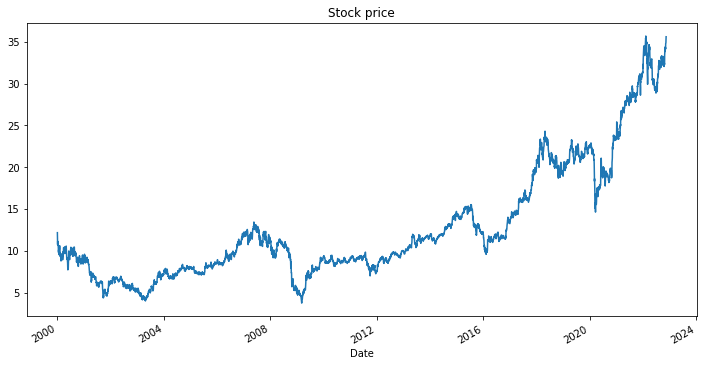

In [ ]:
figure(figsize=(12, 6))
dbs_df['Close'].plot(title="Stock price")

Showing that the stock price data is not stationary as is through the Dickey-Fuller test - tests the null hypothesis that a unit root is present in an autoregressive time series model.

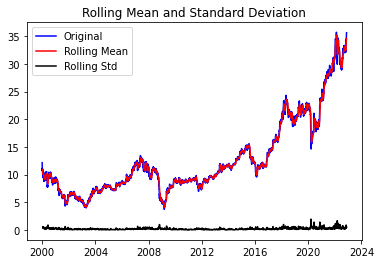

Results of dickey fuller test
Test Statistics                   1.519884
p-value                           0.997596
No. of lags used                 15.000000
Number of observations used    5723.000000
critical value (1%)              -3.431493
critical value (5%)              -2.862045
critical value (10%)             -2.567039
dtype: float64


In [ ]:
#Test for staionarity
def test_stationarity(timeseries):
    #Determing rolling statistics
    rolmean = timeseries.rolling(12).mean()
    rolstd = timeseries.rolling(12).std()
    #Plot rolling statistics:
    plt.plot(timeseries, color='blue',label='Original')
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)
    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    #hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)
test_stationarity(dbs_df['Close'])

As seen, the p-valuse is > 0.05 so the null hypothesis cannot be rejected and the time series is not stationary.

Using price difference instead should make the data stationary. The data is also normalized to have zero mean and unit standard deviation, as is standard practice when training SVRs. In addition, the data over the entire period is split into the training and testing set via an 80:20 split.

In [ ]:
stock_data = dbs_df
train_split = 0.8
cv = 3
window_len = 3

close_prices = stock_data['Close']
# values = close_prices.values
# training_data_len = math.ceil(len(values) * train_split)

vals = close_prices.values
values = vals[1:] - vals[:-1]

training_data_len = math.ceil(len(values) * train_split)
train_values = np.array(values[:training_data_len])
min_values = min(train_values)
max_values = max(train_values)
print(min_values, max_values)

train_mean = np.mean(train_values)
train_std = np.std(train_values)
print(train_mean, train_std)

# scaler = MinMaxScaler(feature_range=(-1,1))
# scaled_data = scaler.fit_transform(values.reshape(-1,1))

# train_data = scaled_data[0: training_data_len, :]
train_data = (train_values - train_mean) / train_std
print(train_data.shape)

-0.8009395599365234 1.0639572143554688
0.0025006607710419335 0.1492829328960397
(4591,)


Using price difference instead to make the time series stationary. Stationarity is important for most time series modelling techniques. Most papers presented in the Literature Review section utilize some method of preprocessing that makes the data more amenable to modelling with fewer parameters.

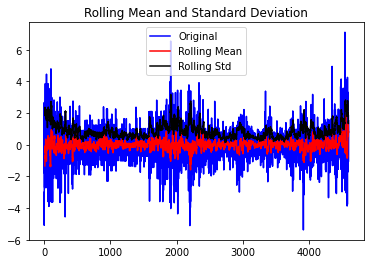

Results of dickey fuller test
Test Statistics                 -64.551008
p-value                           0.000000
No. of lags used                  0.000000
Number of observations used    4590.000000
critical value (1%)              -3.431775
critical value (5%)              -2.862170
critical value (10%)             -2.567105
dtype: float64


In [ ]:
test_stationarity(pd.Series(train_data))

As seen, this time the null hypothesis can be rejected.

Next, the training set is split into validation subsets for 3-fold cross validation. But this is not as simple to do when dealing with time series data since the data need to be sequential. Hence, cross validation needs to be done in a rolling manner as illustrated in the image below:

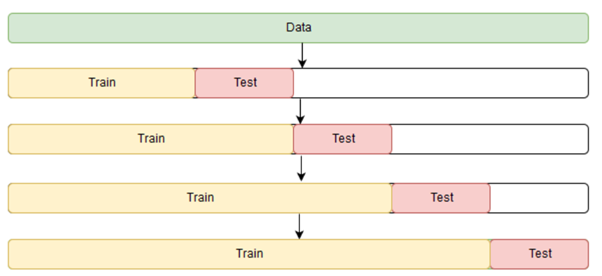

In [ ]:
tscv = TimeSeriesSplit(n_splits=cv)
x_train_folds = []
y_train_folds = []
x_val_folds = []
y_val_folds = []
for train_index, test_index in tscv.split(train_data):
    print("Train index len:", len(train_index))
    x_train = []
    y_train = []
    x_val = []
    y_val = []
    train_fold = train_data[train_index]
    # print(len(train_fold))
    for i in range(window_len, len(train_fold)):
        x_train.append(train_fold[i-window_len:i])
        y_train.append(train_fold[i])
    x_train = np.array(x_train)
    # x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
    x_train_folds.append(x_train)
    y_train_folds.append(np.array(y_train))

    val_fold = train_data[test_index]
    for i in range(window_len, len(val_fold)):
        x_val.append(val_fold[i-window_len:i])
        y_val.append(val_fold[i])
    x_val = np.array(x_val)
    # x_val = np.reshape(x_val, (x_val.shape[0], x_val.shape[1], 1))
    x_val_folds.append(x_val)
    y_val_folds.append(np.array(y_val))

print(f"Created {len(x_val_folds)} folds of training data for cross validation.")

Train index len: 1150
Train index len: 2297
Train index len: 3444
Created 3 folds of training data for cross validation.


In [ ]:
test_values = values[training_data_len-window_len:]
test_data = (np.array(test_values) - train_mean) / train_std
x_test = []
y_test = values[training_data_len:]

for i in range(window_len, len(test_data)):
  x_test.append(test_data[i-window_len:i])

x_test = np.array(x_test)
print(x_test.shape, len(y_test))
# x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

(1147, 3) 1147


Visualizing the price difference values in the training set.

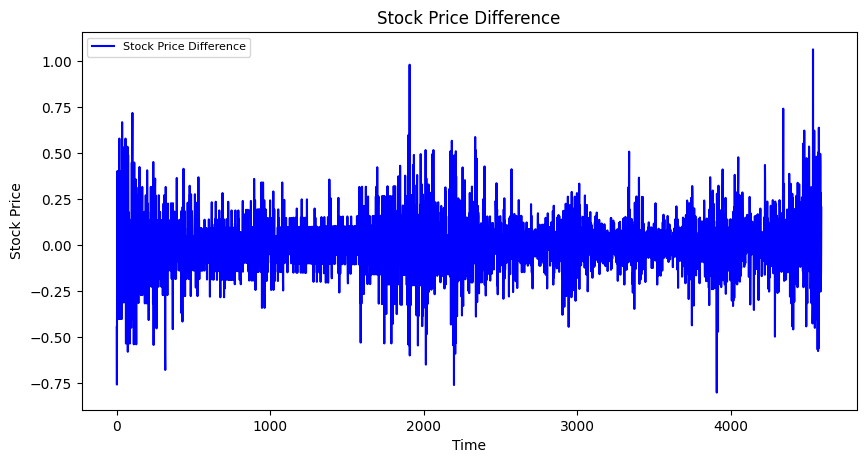

In [ ]:
plt.figure(figsize=(10,5), dpi=100)
plt.plot(train_values, color = 'blue', label='Stock Price Difference')

plt.title('Stock Price Difference')
plt.xlabel('Time')
plt.ylabel('Stock Price')
plt.legend(loc='upper left', fontsize=8)
plt.show()

## Fuzzy inputs

The input and output spaces need corresponding fuzzy membership functions, which are constructed in the following sections. 3 membership functions are chosen for the input corresponding to decrease, no change and increase in price. 5 membership functions are chosen for the output, namely decrease, small decrease, no change, small increase and increase in price.

In [ ]:
def gaussmf(x, params):
    assert len(params) == 2, 'Gaussmf function must have 2 parameters.'
    sig, c = np.asarray(params)
    return np.exp(-pow((x - c), 2) / (2 * pow(sig, 2)))

def gauss2mf(x, params):
    assert len(params) == 4, 'Gauss2mf function must have 4 parameters.'
    sig1, c1, sig2, c2 = np.asarray(params)
    assert c1 <= c2, 'c1 <= c2 is required.'
    if np.isscalar(x):
        if x<=c1:
            y=gaussmf(x, [sig1, c1])
        else:
            y=gaussmf(x,[sig2, c2])
    else:
        y = np.ones(len(x))
        idx1 = (x <= c1)
        idx2 = (x > c2)
        y[idx1] = gaussmf(x[idx1], [sig1, c1])
        y[idx2] = gaussmf(x[idx2], [sig2, c2])
    return y

# This function overwrites the evalmf function of the fuzzy logic toolbox by looking for the function name defined by
# mf.Type and calling it directly.
def evalmf(mf, x):
    possibles = globals().copy()
    possibles.update(locals())
    method = possibles.get(mf.Type)
    return method(x, mf.Parameters)

class fuzzymf(object):
    def __init__(self, Type, Parameters):
        self.Type = Type
        self.Parameters = Parameters
    def __repr__(self):
            return 'fismf, '\
                ' Type: %s, '\
                ' Parameters: %s\n'\
                % (self.Type,self.Parameters)



def euclidean_distance(x1,x2):
    return np.sqrt(np.sum((x1-x2)**2))

# Locate the best matching unit
def find_winner(weights, test_sample):
    distances = list()
    for weight_index, weight in enumerate(weights):
        dist = euclidean_distance(weight, test_sample)
        distances.append((weight_index, dist))
    distances.sort(key=lambda tuple: tuple[1])
    return distances[0][0]

# Train a set of codebook vectors
def train_LVQ(traindata, weights, lrate, epochs):
    # print("Weights:",weights)
    for epoch in range(epochs):
        rate = lrate * (1.0-(epoch/float(epochs)))
        sum_error = 0.0
        for row in traindata:
            winner_index = find_winner(weights, row)
            #print("Winner:",winner)
            error = (row - weights[winner_index])
            sum_error = sum_error + np.sqrt(sum(error**2))
            # This line has an error in changing the original dataset
            # weights[winner_index] += rate * error
            weights[winner_index] = weights[winner_index] + rate * error
            #print("Winner:",winner)
        print('>epoch=%d, lrate=%.3f, error=%.3f' % (epoch, rate, sum_error))
    return weights


def LVQ_learnmem(x, params, learn_rate=0.3, n_epochs=20):

    assert len(params) == 2, 'spam_learnmem function must have 2 parameters.'
    nlabels, tail = np.asarray(params)
    nlabels=int(nlabels)
    tail=bool(tail)

    # First get the max and min of each dimension
    maxx=np.amax(x, axis=0)
    minx=np.amin(x, axis=0)

    if x.ndim==1:
        ninputs=1
    else:
        ninputs=np.size(x,1)

    fis = []
    centroids = [x[i] for i in range(nlabels)]
    centroids = train_LVQ(x, centroids, learn_rate, n_epochs)
    # print("Centroids:", centroids)
    centroids = np.transpose(np.array(centroids))
    centroids = centroids[:, centroids[0, :].argsort()]
    # print("Sorted transposed:", centroids)
    for i in range(ninputs):
        # print("Input:", i)
        width = 1.0 / np.sqrt((-8 * np.log(0.5)))
        sig=(centroids[i][1]-centroids[i][0])*width
        mf=[]
        if(tail):
            mf.append(fuzzymf(Type = 'gauss2mf', Parameters = [sys.maxsize, centroids[i][0], sig, centroids[i][0]]))
            print([centroids[i][0], centroids[i][0]])
            for j in range(1, nlabels-1):
                sig=(centroids[i][j]-centroids[i][j-1])*width
                mf.append(fuzzymf(Type = 'gauss2mf', Parameters = [sig, centroids[i][j], sig, centroids[i][j]]))
            sig=(centroids[i][nlabels-1]-centroids[i][nlabels-2])*width
            print([centroids[i][nlabels-1], centroids[i][nlabels-1]])
            mf.append(fuzzymf(Type = 'gauss2mf', Parameters = [sig, centroids[i][nlabels-1], sys.maxsize, centroids[i][nlabels-1]]))
        else:
            for j in range(nlabels):
                sig=(centroids[i][j]-centroids[i][j-1])*width
                mf.append(fuzzymf(Type = 'gauss2mf', Parameters = [sig, centroids[i][j], sig, centroids[i][j]]))
        fis.append(mf)
    return fis

In [ ]:
# This function creates nlabels number of gauss2mf that spans min and max of the inputs
def span_learnmem2(x, params):

    assert len(params) == 2, 'spam_learnmem function must have 2 parameters.'
    nlabels, tail = np.asarray(params)
    nlabels=int(nlabels)
    tail=bool(tail)

    # First get the max and min of each dimension
    maxx=np.amax(x, axis=0)
    minx=np.amin(x, axis=0)

    if x.ndim==1:
        ninputs=1
    else:
        ninputs=np.size(x,1)

    fis = []
    for i in range(ninputs):
        if ninputs==1:
            centroids=np.linspace(minx[0],maxx[0],int(nlabels))
            print(minx,maxx)
            print("Done")
        else:
            centroids=np.linspace(minx[i],maxx[i],int(nlabels))
        width = 1.0 / np.sqrt((-8 * np.log(0.5)))
        sig=(centroids[1]-centroids[0])*width
        mf=[]
        if(tail):
            mf.append(fuzzymf(Type = 'gauss2mf', Parameters = [sys.maxsize, centroids[0], sig, centroids[0]]))
            for j in range(1, nlabels-1):
                mf.append(fuzzymf(Type = 'gauss2mf', Parameters = [sig, centroids[j], sig, centroids[j]]))
            mf.append(fuzzymf(Type = 'gauss2mf', Parameters = [sig, centroids[nlabels-1], sys.maxsize, centroids[nlabels-1]]))
        else:
            for j in range(nlabels):
                mf.append(fuzzymf(Type = 'gauss2mf', Parameters = [sig, centroids[j], sig, centroids[j]]))
        fis.append(mf)
    return fis

Using LVQ to learn the best centroids for gaussian membership functions.

In [ ]:
n_input_mf = 3.0
inmf_tail = LVQ_learnmem(train_values.reshape(-1,1), [n_input_mf, True], n_epochs=40)
# inmf_tail = span_learnmem2(train_values.reshape(-1,1), [n_input_mf, True])
print(inmf_tail)

>epoch=0, lrate=0.300, error=248.180
>epoch=1, lrate=0.292, error=241.844
>epoch=2, lrate=0.285, error=241.143
>epoch=3, lrate=0.278, error=240.725
>epoch=4, lrate=0.270, error=240.453
>epoch=5, lrate=0.263, error=240.416
>epoch=6, lrate=0.255, error=240.058
>epoch=7, lrate=0.247, error=242.301
>epoch=8, lrate=0.240, error=242.136
>epoch=9, lrate=0.232, error=241.421
>epoch=10, lrate=0.225, error=241.702
>epoch=11, lrate=0.217, error=241.577
>epoch=12, lrate=0.210, error=241.614
>epoch=13, lrate=0.203, error=241.157
>epoch=14, lrate=0.195, error=241.092
>epoch=15, lrate=0.188, error=241.444
>epoch=16, lrate=0.180, error=240.553
>epoch=17, lrate=0.172, error=239.840
>epoch=18, lrate=0.165, error=238.785
>epoch=19, lrate=0.158, error=238.787
>epoch=20, lrate=0.150, error=238.186
>epoch=21, lrate=0.142, error=238.281
>epoch=22, lrate=0.135, error=238.254
>epoch=23, lrate=0.128, error=238.740
>epoch=24, lrate=0.120, error=238.141
>epoch=25, lrate=0.112, error=238.111
>epoch=26, lrate=0.105

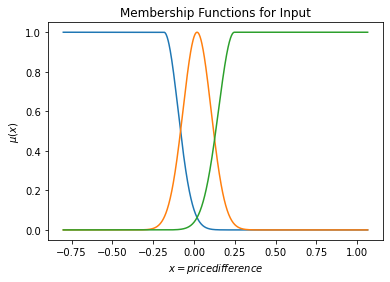

In [ ]:
x = np.linspace(min_values, max_values, 1000)
plt.plot(x, evalmf(inmf_tail[0][0], x))
plt.plot(x, evalmf(inmf_tail[0][1], x))
plt.plot(x, evalmf(inmf_tail[0][2], x))

plt.xlabel('$x = price difference$')
plt.ylabel('$\mu(x)$')
plt.title('Membership Functions for Input')
plt.show()

In [ ]:
n_output_mf = 5.0
outmf_tail = LVQ_learnmem(train_values.reshape(-1,1), [n_output_mf, True], n_epochs=40)
# outmf_tail = span_learnmem2(train_values.reshape(-1,1), [n_output_mf, True])
print(outmf_tail)

>epoch=0, lrate=0.300, error=182.845
>epoch=1, lrate=0.292, error=177.113
>epoch=2, lrate=0.285, error=176.131
>epoch=3, lrate=0.278, error=176.103
>epoch=4, lrate=0.270, error=176.153
>epoch=5, lrate=0.263, error=175.237
>epoch=6, lrate=0.255, error=176.324
>epoch=7, lrate=0.247, error=176.456
>epoch=8, lrate=0.240, error=175.543
>epoch=9, lrate=0.232, error=175.556
>epoch=10, lrate=0.225, error=175.268
>epoch=11, lrate=0.217, error=175.837
>epoch=12, lrate=0.210, error=175.731
>epoch=13, lrate=0.203, error=174.375
>epoch=14, lrate=0.195, error=174.520
>epoch=15, lrate=0.188, error=174.900
>epoch=16, lrate=0.180, error=175.870
>epoch=17, lrate=0.172, error=175.801
>epoch=18, lrate=0.165, error=175.951
>epoch=19, lrate=0.158, error=175.848
>epoch=20, lrate=0.150, error=176.349
>epoch=21, lrate=0.142, error=176.938
>epoch=22, lrate=0.135, error=180.043
>epoch=23, lrate=0.128, error=178.456
>epoch=24, lrate=0.120, error=177.876
>epoch=25, lrate=0.112, error=178.318
>epoch=26, lrate=0.105

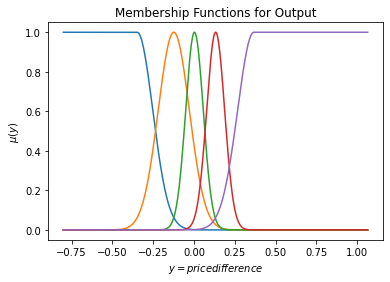

In [ ]:
plt.plot(x, evalmf(outmf_tail[0][0], x))
plt.plot(x, evalmf(outmf_tail[0][1], x))
plt.plot(x, evalmf(outmf_tail[0][2], x))
plt.plot(x, evalmf(outmf_tail[0][3], x))
plt.plot(x, evalmf(outmf_tail[0][4], x))

plt.xlabel('$y = price difference$')
plt.ylabel('$\mu(y)$')
plt.title('Membership Functions for Output')
plt.show()

Noramlize and create fuzzy train and test sets. Each value is corresponds to the degree of membership of the price difference and a memebership function.

In [ ]:
x_train_fuzzy = []

for i in range(window_len, len(train_values)):
    w_features = []
    w_features.append(evalmf(inmf_tail[0][0], train_values[i-window_len:i]))
    w_features.append(evalmf(inmf_tail[0][1], train_values[i-window_len:i]))
    w_features.append(evalmf(inmf_tail[0][2], train_values[i-window_len:i]))
    w_features = np.array(w_features)
    w_features = np.transpose(w_features)
    x_train_fuzzy.append(w_features)


x_train_fuzzy = np.array(x_train_fuzzy)
x_train_fuzzy = np.reshape(x_train_fuzzy, (x_train_fuzzy.shape[0], x_train_fuzzy.shape[1] * x_train_fuzzy.shape[2]))
fuzzy_train_mean = np.mean(x_train_fuzzy)
fuzzy_train_std = np.std(x_train_fuzzy)
x_train_fuzzy = (x_train_fuzzy - fuzzy_train_mean) / fuzzy_train_std
print(x_train_fuzzy.shape)
tscv = TimeSeriesSplit(n_splits=cv)

(4588, 9)


In [ ]:
x_test_fuzzy = []

for i in range(window_len, len(test_values)):
    w_features = []
    w_features.append(evalmf(inmf_tail[0][0], test_values[i-window_len:i]))
    w_features.append(evalmf(inmf_tail[0][1], test_values[i-window_len:i]))
    w_features.append(evalmf(inmf_tail[0][2], test_values[i-window_len:i]))
    w_features = np.transpose(np.array(w_features))
    x_test_fuzzy.append(w_features)

x_test_fuzzy = np.array(x_test_fuzzy)
x_test_fuzzy = np.reshape(x_test_fuzzy, (x_test_fuzzy.shape[0], x_test_fuzzy.shape[1] * x_test_fuzzy.shape[2]))
x_test_fuzzy = (x_test_fuzzy - fuzzy_train_mean) / fuzzy_train_std
print(x_test_fuzzy.shape)
# x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

(1147, 9)


In [ ]:
y_train_fuzzy = []

for index in range(5):
    y_train_fuzzy_out = []
    for i in range(window_len, len(train_values)):
        y_train_fuzzy_out.append(evalmf(outmf_tail[0][index], train_values[i]))
    y_train_fuzzy_out = (y_train_fuzzy_out - fuzzy_train_mean) / fuzzy_train_std
    y_train_fuzzy.append(y_train_fuzzy_out)

print(len(y_train_fuzzy), len(y_train_fuzzy_out))

5 4588


In [ ]:
y_test_fuzzy = []

for index in range(5):
    y_test_fuzzy_out = []
    for i in range(window_len, len(test_values)):
        y_test_fuzzy_out.append(evalmf(outmf_tail[0][index], test_values[i]))
    y_test_fuzzy.append(y_test_fuzzy_out)

print(len(y_test_fuzzy), len(y_test_fuzzy_out))

5 1147


## Baseline SVR

Train the baseline SVR with crisp inputs and outputs and measure the RMSE. Using 3-fold rolling cross validation while training.

In [ ]:
# x_train = np.reshape(np.array(x_train), (len(x_train), x_train[0].shape[0]))
# x_test = np.reshape(np.array(x_test), (len(x_test), x_test[0].shape[0]))
print(x_train.shape, x_test.shape)
svr_rbf = SVR(kernel= 'poly', C= 0.00001, gamma= 0.1)
svr_rbf.fit(x_train, y_train)
scores = cross_validate(svr_rbf, x_train, y_train, scoring="neg_root_mean_squared_error", cv=tscv)
print("Cross validation scores:", scores)

test_predict=svr_rbf.predict(x_test)
# test_predict = scaler.inverse_transform(test_predict.reshape(-1,1))
test_predict = test_predict * train_std + train_mean
rms_svr_rbf = mean_squared_error(y_test, test_predict, squared=False)

print(f"SVR (RBF) RMSE: {rms_svr_rbf}")

(3441, 3) (1147, 3)
Cross validation scores: {'fit_time': array([0.02749872, 0.10205293, 0.22692227]), 'score_time': array([0.01601648, 0.02906013, 0.04897356]), 'test_score': array([-0.75446322, -1.23786835, -0.68486309])}
SVR (RBF) RMSE: 0.3009105647647133


Using Genetic Algorithm to find hyperparameters of the SVR. Using 3-fold cross validation while training.

**WARNING: This cell takes a long time to run**

In [ ]:
estimator = SVR(kernel= 'poly', C= 0.00001, gamma= 0.1)

selector = GeneticSelectionCV(
        estimator,
        cv=tscv,
        verbose=1,
        scoring="neg_root_mean_squared_error",
        max_features=3,
        n_population=100,
        crossover_proba=0.5,
        mutation_proba=0.5,
        n_generations=50,
        crossover_independent_proba=0.5,
        mutation_independent_proba=0.2,
        tournament_size=5,
        n_gen_no_change=50,
        caching=True,
        n_jobs=4,
    )
selector = selector.fit(x_train, y_train)

test_predict=selector.predict(x_test)
# test_predict = scaler.inverse_transform(test_predict.reshape(-1,1))
test_predict = test_predict * train_std + train_mean
rms_svr_ga = mean_squared_error(y_test, test_predict, squared=False)

print(f"SVR (GA) RMSE: {rms_svr_ga}")

Selecting features with genetic algorithm.
gen	nevals	avg                            	std                            	min                            	max                            
0  	100   	[-0.568892  1.8       0.386686]	[ 0.        0.787401  0.      ]	[-0.568892  1.        0.386686]	[-0.568892  3.        0.386686]
1  	66    	[-700.529069    1.4       700.359618]	[ 2551.325013     0.678233  2551.371503]	[-10000.            0.            0.386686]	[   -0.568892     3.       10000.      ]
2  	74    	[-600.534758    1.23      600.363484]	[ 2374.733313     0.580603  2374.776585]	[-10000.            0.            0.386686]	[   -0.568892     3.       10000.      ]
3  	71    	[-700.529069    1.1       700.359618]	[ 2551.325013     0.479583  2551.371503]	[-10000.            0.            0.386686]	[   -0.568892     2.       10000.      ]
4  	76    	[-600.534758    1.04      600.363484]	[ 2374.733313     0.397995  2374.776585]	[-10000.            0.            0.386686]	[   -0.568892     2.

As seen, there isn't much improvement even with hyperparameters chosen by GA.

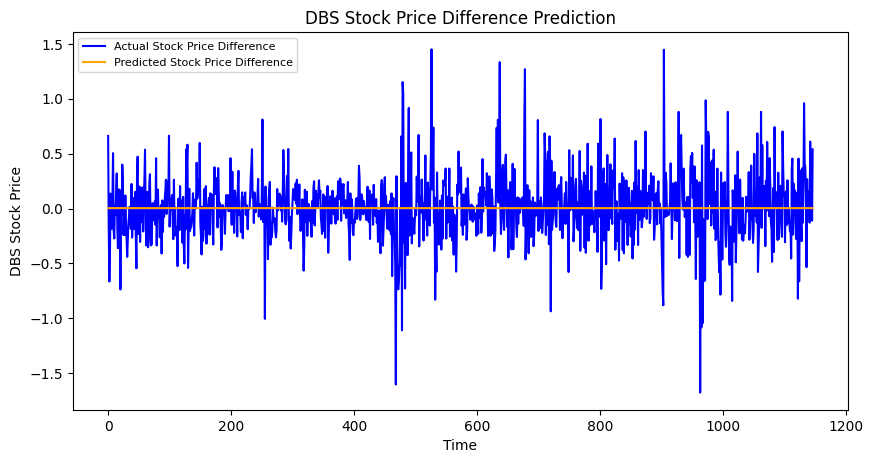

In [ ]:
plt.figure(figsize=(10,5), dpi=100)
plt.plot(y_test, color = 'blue', label='Actual Stock Price Difference')
plt.plot(test_predict, color = 'orange',label='Predicted Stock Price Difference')
# plt.fill_between(lower_series.index, lower_series, upper_series,
                #  color='k', alpha=.10)
plt.title('DBS Stock Price Difference Prediction')
plt.xlabel('Time')
plt.ylabel('DBS Stock Price')
plt.legend(loc='upper left', fontsize=8)
plt.show()

Use the GA tuned SVR to forecast on the test data and find RMSE. Find Random Walk RMSE to compare.

In [ ]:
shifted_prices = vals[training_data_len:-1]
baseline_predictions = shifted_prices + test_predict
actual_prices = vals[training_data_len+1:]
rms_pure_rw = mean_squared_error(actual_prices, shifted_prices, squared=False)
rms_svr_baseline = mean_squared_error(actual_prices, baseline_predictions, squared=False)
print("Pure Random Walk RMSE:", rms_pure_rw)
print("Baseline SVR RMSE:", rms_svr_baseline)

Pure Random Walk RMSE: 0.3010267048106959
Baseline SVR RMSE: 0.30091056476471334


As seen, the baseline SVR outperforms random walk, but by a very small margin. This result can be improved with more tuning.

## Fuzzy SVR

Train 5 different SVRs for the 5 output membership functions. Inputs to the SVR are the degress of membership of each price difference for each of the 3 input membership functions. Similarly, the output to be predicted is the degree of membership in the output membership function corresponding to that SVR.

In [ ]:
svrs = []
preds = []

for i in range(5):
    svr = SVR(kernel= 'poly', C= 0.000001, gamma= 0.1)
    svr.fit(x_train_fuzzy, y_train_fuzzy[i])
    svrs.append(svr)
    scores = cross_validate(svr, x_train_fuzzy, y_train_fuzzy[i], scoring="neg_root_mean_squared_error", cv=tscv)
    print("Cross validation scores:", scores['test_score']*-1)

    test_predict_fuzzy=svr.predict(x_test_fuzzy)
    test_predict = test_predict * fuzzy_train_std + fuzzy_train_mean
    preds.append(test_predict)
    rms_svr = mean_squared_error(y_test_fuzzy[i], test_predict_fuzzy, squared=False)

    print(f"Index {i} SVR RMSE: {rms_svr}")

Cross validation scores: [0.59126728 0.32291143 0.51963709]
Index 0 SVR RMSE: 1.0595941132771134
Cross validation scores: [0.96481013 0.89798679 0.91206179]
Index 1 SVR RMSE: 0.4099973875879672
Cross validation scores: [1.09020829 1.20735837 1.08289262]
Index 2 SVR RMSE: 0.4230989781495788
Cross validation scores: [0.9781709  1.03387495 0.99561477]
Index 3 SVR RMSE: 1.0613903008792593
Cross validation scores: [0.55108476 0.33812842 0.56071014]
Index 4 SVR RMSE: 1.0576270662354024


In [ ]:
preds = np.array(preds)
preds = np.transpose(np.reshape(preds, (preds.shape[0], preds.shape[1])))
print(preds.shape)

(1147, 5)


Defuzzify the result of all outputs by centre of area method.

In [ ]:
def defuzzify(preds, outmf_tail, num_range=(-8,8), num_points=10000):
    x = np.linspace(num_range[0], num_range[1], num_points)
    pred_price_diffs = []
    for i in range(preds.shape[0]):
        mf_cuts = np.zeros(num_points)
        for j in range(preds.shape[1]):
            # print("predicted degree of membership:", preds[i][j])
            cut = np.ones(num_points) * preds[i][j]
            mf_vals = evalmf(outmf_tail[0][j], x)
            # print(cut.shape, mf_vals.shape)
            both = np.vstack((cut, mf_vals))
            # print(both.shape)
            mf_cut = np.min(both, axis=0)
            # print(mf_cut.shape)
            mf_cuts = np.vstack((mf_cuts, mf_cut))
        # print("mf_cuts.shape:", mf_cuts.shape)
        final_mf_cut = np.max(mf_cuts, axis=0)
        # print(final_mf_cut.shape, final_mf_cut)
        price_diff = np.dot(final_mf_cut, x) / np.sum(final_mf_cut)
        # print("Defuzzified:", price_diff)
        pred_price_diffs.append(price_diff)
    return pred_price_diffs


pred_price_diffs = defuzzify(preds, outmf_tail, num_range=(min_values, max_values))

Evaluate the RMSE value and compare to random walk.

In [ ]:
fuzzy_predictions = shifted_prices + pred_price_diffs
rms_svr_fuzzy = mean_squared_error(actual_prices, fuzzy_predictions, squared=False)
print("Pure Random Walk RMSE:", rms_pure_rw)
print("Fuzzy SVR RMSE:", rms_svr_fuzzy)

Pure Random Walk RMSE: 0.3010267048106959
Fuzzy SVR RMSE: 0.36499206502622616


Again, the performance is comparable to random walk and slightly outperforms it.

## Fuzzy Rules

Mamdani Fuzzy inference system chosen. First step is to find fuzzy rules using Hebbian Learning. POPFNN code is used for the same.

In [ ]:
class popfnn(object):
    In_mf:fuzzymf
    Out_mf:fuzzymf
    N_inputs:int
    N_outlabels:int
    Lut_m:np
    Lut_d:np
    N_rules:int
    Pweights:np

    def __init__(self, In_mf, Out_mf):
        self.In_mf = In_mf
        self.Out_mf = Out_mf

        self.N_inputs=len(self.In_mf)
        self.N_outlabels=len(self.Out_mf[0])
        self.Lut_m=np.empty(self.N_inputs, np.int8)
        self.Lut_d=np.empty(self.N_inputs, np.int8)

        # Calculate lookup tables for rule access
        self.N_rules = 1
        for i in range(self.N_inputs):
            self.Lut_m[i] = len(self.In_mf[i]) #n_mf
            self.Lut_d[i] = 1
            self.N_rules = self.N_rules * self.Lut_m[0]
            for j in range(i):
                self.Lut_d[j] = self.Lut_d[j] * self.Lut_m[j]

        # Initialize pseudo weights for all rules
        self.pweights = np.zeros([self.N_rules,self.N_outlabels])

    # returns the membership label given rule number and the ninput
    def getlabel(self, rule, ninput):
        return ( int((int(rule)/(self.Lut_d[ninput]))%self.Lut_m[ninput]));

    def printruleslabels(self):
        print('N_inputs=',self.N_inputs)
        print('N_rules=',self.N_rules)
        print('N_output_mf=',self.N_outlabels)
        print('rule_number, labels, pweights, consequent label')
        for i in range(self.N_rules):
            print(i,end = ' ')
            for j in range(self.N_inputs):
                print(self.getlabel(i,j),end = ' ')
            for j in range(self.N_outlabels):
                print(self.pweights[i][j],end = ' ')
            print(self.identify_rule(i), end = ' ')
            print(' ')

    def poplearn(self, x, y):
        for r in range(self.N_rules):
            min_t=1.0
            for i in range(self.N_inputs):
                # Get the label of input i for rule r
                label=self.getlabel(r,i)
                # Compute membership of input i
                t=evalmf(self.In_mf[i][label],x[i])
                # Compute min across all input membership functions
                min_t=min(min_t,t)
            for i in range(self.N_outlabels):
                t=evalmf(self.Out_mf[0][i],y)
                self.pweights[r][i]+=min_t*t

    def identify_rule(self, rule_index):
        rule_pweights = np.array([self.pweights[rule_index][i] for i in range(self.N_outlabels)])
        label_index = np.argmax(rule_pweights)
        label = label_index + 1
        return label

Since there are 3 input membership functions and 3 time steps, there will be a total of 27 rules.

In [ ]:
input_mfs = inmf_tail * 3
nf=popfnn(In_mf=input_mfs, Out_mf=outmf_tail)

Creating a more diverse sample by reducing the number of no change samples for pseudo weight calculation.

In [ ]:
num = int((0.70 * len(y_train)) // 2)
y_np = np.array(y_train)
indices = y_np.argsort()
inds = indices[:num]
inds = np.append(inds, indices[::-1][:num])
print(inds.shape)
# for i in range(5):
#     t=evalmf(outmf_tail[0][i], y_np[indices[0]])
#     print(i, t)
# print(max(y_np), y_np[indices[0]])

(2408,)


In [ ]:
for k in inds:
    # ind = random.choice(range(len(y_train)))
    nf.poplearn(x_train[k],y_train[k])
nf.printruleslabels()

N_inputs= 3
N_rules= 27
N_output_mf= 5
rule_number, labels, pweights, consequent label
0 0 0 0 110.98702168973774 0.9042132744412438 8.375212877231789e-07 0.06626934614284888 125.34893130220101 5  
1 0 0 1 33.23116406964993 0.2863713458393241 9.186117877745864e-08 0.009868640300925898 33.42708652044987 5  
2 0 0 2 112.29994230279351 1.2372835390372854 7.71032967287997e-07 0.056246835939031736 92.286546921932 1  
3 0 1 0 31.78482511471886 0.5833854778540409 2.868553704410084e-07 0.021110908931334035 32.51861347418549 5  
4 0 1 1 13.68484835638013 0.29852258603026455 1.4387955126932458e-07 0.011881107465598641 14.744366634567482 5  
5 0 1 2 38.3632300513216 0.29692144406280463 2.5435334874761475e-07 0.023050580407547275 29.339364201005292 1  
6 0 2 0 104.72897528277413 1.187104205022897 5.424302034834045e-07 0.04549651281222773 100.71407485961979 1  
7 0 2 1 39.137840909282026 0.8463261647583956 3.243104471027434e-07 0.021928988434529922 35.35620202587074 1  
8 0 2 2 103.03972076497197 0

The rules are shown above. The consequent lables are as following: 1 - decreasing, 2 - small decrease, 3 - no change, 4 - small increase, 5 - increasing.

Example rule from above: \\
0 0 2 -> 2 \\
Which corresponds to: \\
decrease, decrease, increase -> small decrease.

In [ ]:
def prune_rules(nf, firing_threshold=5):
    sig_rules = []
    for i in range(nf.N_rules):
        pweights = nf.pweights[i]
        # print("pweights:", pweights)
        if(not np.any(pweights > firing_threshold)):
            continue
        max_pos = np.argmax(pweights)
        max = pweights[max_pos]
        # print("Max:", max)
        others = np.delete(pweights, max_pos)
        # print("Others", others)
        diffs = max - others
        # print("Diff", diffs)
        if(not np.any(diffs < firing_threshold)):
            sig_rules.append(i)

    if(len(sig_rules) > 0):
        print(f"Significant rules with firing threshold = {firing_threshold} :")
        print('rule_number, labels, pweights, consequent label')
        for i in sig_rules:
            print(i,end = ' ')
            for j in range(nf.N_inputs):
                print(nf.getlabel(i,j),end = ' ')
            for j in range(nf.N_outlabels):
                print(nf.pweights[i][j],end = ' ')
            print(nf.identify_rule(i), end = ' ')
            print(' ')
    else:
        print(f"No significant rules found with firing threshold = {firing_threshold}")

prune_rules(nf)

Significant rules with firing threshold = 5 :
rule_number, labels, pweights, consequent label
0 0 0 0 110.98702168973774 0.9042132744412438 8.375212877231789e-07 0.06626934614284888 125.34893130220101 5  
2 0 0 2 112.29994230279351 1.2372835390372854 7.71032967287997e-07 0.056246835939031736 92.286546921932 1  
5 0 1 2 38.3632300513216 0.29692144406280463 2.5435334874761475e-07 0.023050580407547275 29.339364201005292 1  
8 0 2 2 103.03972076497197 0.8988361793247156 5.727711951992546e-07 0.043160402398054645 87.83092891117373 1  
11 1 0 2 36.781779116241594 0.6393636086475033 5.805305601199761e-07 0.04012006217886619 29.326470314976927 1  
18 2 0 0 109.10629555245858 1.1671522686567877 5.091040969906081e-07 0.04052480889879519 96.3270368926346 1  
20 2 0 2 87.9944665011164 1.147622536563832 5.435474645713605e-07 0.04001054455425086 107.28785050406847 5  
22 2 1 1 9.45122832569748 0.14165764624571225 9.039732594990773e-08 0.009253100119041093 17.73160666790477 5  
23 2 1 2 29.7735996991

## Algorithmic Trading

Now that we have predictions of the price, we need some way to know when to buy or sell the stock. This is done through algorithmic trading methods where a signal is extracted by observing the day-to-day change in the stock price and decisions are made based on that and the predicted next-day price.

In this project, I've explored two trading signals - fast and slow simple moving average crossover, and Moving Average Convergence Divergence (MACD) using exponential moving average.

These averages are required so that a small window of volatility doesn't lead to bad trading decisions and instead, trading is done on the trend of the price.


### Helper functions

In [ ]:
def add_trade_signal(df):
    df['Trade'] = df['Position']
    prevrow = df.iloc[0]
    print(prevrow['Position'])
    for index, row in df.iloc[1:].iterrows():
        if row['Trade']==0:
            if prevrow['Trade']!=0:
                df.at[index,'Trade']=prevrow['Trade']
                row['Trade']=prevrow['Trade']
        prevrow=row
    return df

In [ ]:
def computereturns(tdf,trate):
  prevrow = tdf.iloc[0]
  returncol=tdf.columns.get_loc('Returns')
  for i in range(len(tdf)):
    if i==0:
      prev_i=i
    else:
      prevrow=tdf.iloc[prev_i]
      row=tdf.iloc[i]
      rt=(row['Close']/prevrow['Close'])-1
      t=prevrow['Returns']*(1+prevrow['Trade']*rt)*(1-trate*abs(row['Trade']-prevrow['Trade']))
      tdf.iat[i,returncol]=t
      prev_i=i
  return tdf

In [ ]:
import warnings
warnings.filterwarnings("ignore")

### SMA Crossover

Using a Fast and Slow simple moving average crossover to determine the trading signal.

In [ ]:
def get_sma_trade_signals(df, slow, fast, ideal=True, trate=0.005):
    if(not ideal):
        df['Fast_SMA'] = df['Close'].rolling(window = fast, min_periods = 1, closed='left').mean()
        df['Slow_SMA'] = df['Close'].rolling(window = slow, min_periods = 1, closed='left').mean()
    else:
        df['Fast_SMA'] = df['Close'].rolling(window = fast, min_periods = 1).mean()
        df['Slow_SMA'] = df['Close'].rolling(window = slow, min_periods = 1,).mean()
    df = df.iloc[1: , :]
    df['Signal'] = 0.0
    df['Signal'] = np.where(df['Fast_SMA'] > df['Slow_SMA'], 1.0, 0.0)
    df['Position'] = df['Signal'].diff()
    df['Position'].iloc[0]=0
    df = add_trade_signal(df)
    df['Returns'] = 1.0
    df = computereturns(df, trate)
    return df

Choosing the value of the fast and slow moving averages is quite challenging. So, I'm using GA to obtain the values by evaluating the mean returns on the training set.

In [ ]:
def fitness_func(solution, solution_idx):
    sma_df = get_sma_trade_signals(dbs_df.iloc[:training_data_len,:].copy(), int(solution[0]), int(solution[1]), ideal=True)
    sma_df['Returns'] = 1.0
    sma_df = computereturns(sma_df,0.005)
    fitness = sma_df['Returns'].mean()
    print(solution, fitness)
    return fitness

**WARNING: The following GA tuning cell takes a long time to run.**



In [ ]:
fitness_function = fitness_func

num_generations = 25
num_parents_mating = 4

sol_per_pop = 8
num_genes = 2

init_range_low = 9
init_range_high = 500

parent_selection_type = "sss"
keep_parents = 1

crossover_type = "single_point"

mutation_type = "random"
mutation_percent_genes = 10

sma_ga_instance = pygad.GA(num_generations=num_generations,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_function,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=init_range_low,
                       init_range_high=init_range_high,
                       parent_selection_type=parent_selection_type,
                       keep_parents=keep_parents,
                       crossover_type=crossover_type,
                       mutation_type=mutation_type,
                       mutation_percent_genes=mutation_percent_genes)

sma_ga_instance.run()

0.0
[192.14847072  85.48740035] 1.1885555437802262
0.0
[338.92873341  48.39819461] 1.0095129815439126
0.0
[249.48302962  58.50226657] 1.3275513537875843
0.0
[161.44328304  23.07309346] 0.7432204821949704
0.0
[481.90610598 454.11297639] 1.3217200327980063
0.0
[ 71.61822093 360.27846633] 0.3445354975943631
0.0
[279.69457001 266.19388243] 0.6017193573541999
0.0
[129.06510882  76.31750137] 1.0136509406524716
0.0
[482.16280668 454.11297639] 1.3508274319179188
0.0
[481.90610598  86.13785263] 1.0269979901857864
0.0
[129.06510882  76.20634822] 1.0136509406524716
0.0
[249.48302962  58.65071411] 1.3275513537875843
0.0
[481.64620531 454.11297639] 1.3217200327980063
0.0
[482.58983212  85.48740035] 1.0554378434052676
0.0
[129.28767644  76.31750137] 1.0136509406524716
0.0
[249.36981186  58.65071411] 1.3275513537875843
0.0
[250.10584229  58.50226657] 1.345189518553677
0.0
[481.64620531 453.7642906 ] 1.324514932927136
0.0
[482.58142855 454.11297639] 1.3508274319179188
0.0
[248.86461298  58.65071411] 1

In [ ]:
solution, solution_fitness, solution_idx = sma_ga_instance.best_solution()
print("SMA Window Length tuning with GA:")
print("Parameters of the best solution : {solution}".format(solution=solution))
print("Fitness value of the best solution = {solution_fitness}".format(solution_fitness=solution_fitness))

0.0
[251.78029845  55.61055921] 1.3210032259279416
0.0
[251.56498572  56.98097741] 1.4383256943515037
0.0
[251.31580526  57.70596782] 1.3860624817016625
0.0
[250.24681614  56.27167438] 1.4187114366048335
0.0
[252.31692623  56.01191544] 1.425579717437075
0.0
[251.92741465  56.98097741] 1.4383256943515037
0.0
[251.95406101  56.98097741] 1.4383256943515037
SMA Window Length tuning with GA:
Parameters of the best solution : [251.24507367  56.27167438]
Fitness value of the best solution = 1.4383256943515037


In [ ]:
fast=int(solution[1])
slow=int(solution[0])
# fast = 218
# slow = 492 # providing GA values for easy reruning
sma_df = dbs_df.iloc[:training_data_len,:].copy()
sma_df = get_sma_trade_signals(sma_df, slow, fast, ideal=False)

sma_df_ideal = dbs_df.iloc[:training_data_len,:].copy()
sma_df_ideal = get_sma_trade_signals(sma_df_ideal, slow, fast, ideal=True)

0.0
0.0


Following is the returns for no prediction and ideal prediction using SMA windows obtained from GA. As seen, the trading system is able to achieve a high return.

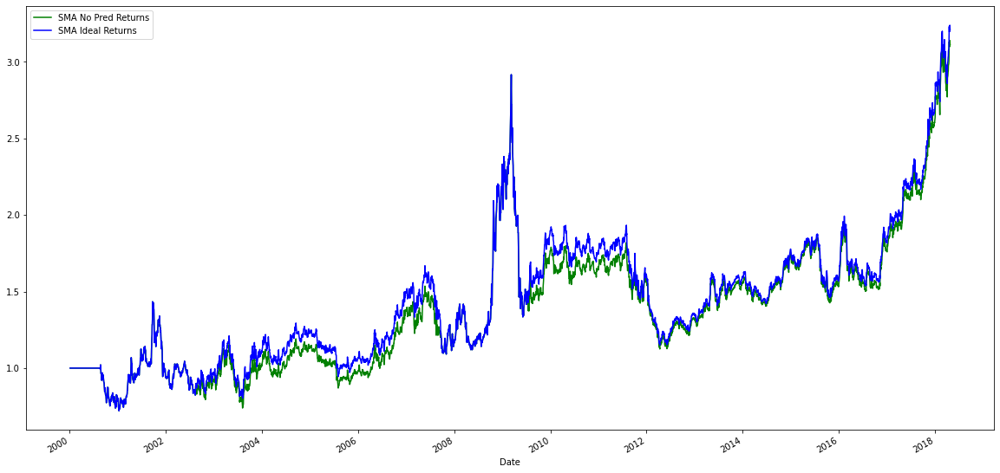

In [ ]:
plt.figure(figsize = (20,10))
sma_df['Returns'].plot(color='g', label= 'SMA No Pred Returns')
sma_df_ideal['Returns'].plot(color='b', label= 'SMA Ideal Returns')
plt.legend()
plt.show()

Next, apply the same to the test dataset and visualize returns

In [ ]:
fast=int(solution[1])
slow=int(solution[0])
df_sma_test = dbs_df.iloc[training_data_len+1:,:].copy()
df_sma_test = get_sma_trade_signals(df_sma_test, slow, fast, ideal=False)

df_sma_test_ideal = dbs_df.iloc[training_data_len+1:,:].copy()
df_sma_test_ideal = get_sma_trade_signals(df_sma_test_ideal, slow, fast, ideal=True)

df_sma_baseline = dbs_df.iloc[training_data_len+1:,:].copy()
df_sma_baseline.drop(columns=['Close'])
df_sma_baseline['Close'] = baseline_predictions
df_sma_baseline = get_sma_trade_signals(df_sma_baseline, slow, fast, ideal=True)

df_sma_fuzzy = dbs_df.iloc[training_data_len+1:,:].copy()
df_sma_fuzzy.drop(columns=['Close'])
df_sma_fuzzy['Close'] = fuzzy_predictions
df_sma_fuzzy = get_sma_trade_signals(df_sma_fuzzy, slow, fast, ideal=True)


0.0
0.0
0.0
0.0


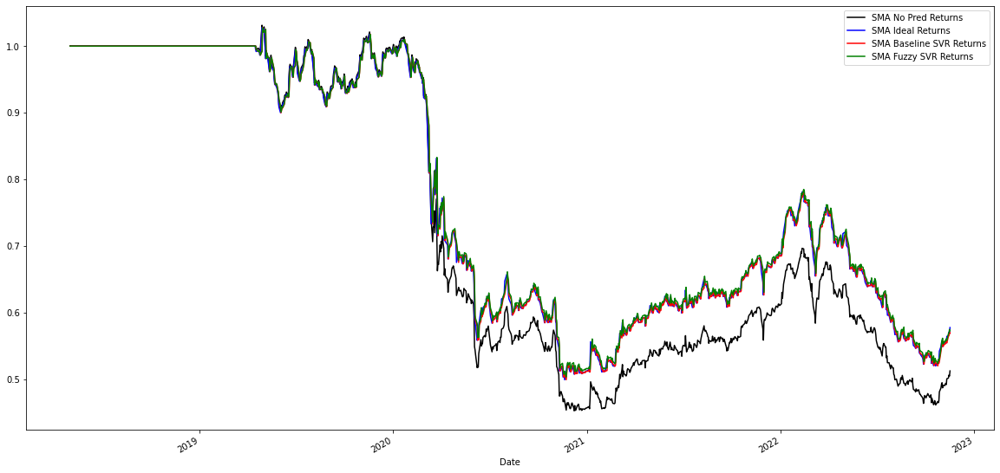

In [ ]:
plt.figure(figsize = (20,10))
df_sma_test['Returns'].plot(color='black', label= 'SMA No Pred Returns')
df_sma_test_ideal['Returns'].plot(color='b', label= 'SMA Ideal Returns')
df_sma_baseline['Returns'].plot(color='r', label='SMA Baseline SVR Returns')
df_sma_fuzzy['Returns'].plot(color='g', label='SMA Fuzzy SVR Returns')
plt.legend()
plt.show()

In this case, the optimal GA values do not perform as well. The difference between ideal and no prediction is not very large. There are also some sub-periods where no prediction outperforms ideal prediction.

The difference in performance is likely because the nature of the stock is different in this test period and as seen from the initial plot of the stock, there is higher volatility towards the end of the period.

Using hand-crafted window values to illustrate the difference in returns and the effectiveness of the predictions.

In [ ]:
fast=40
slow=125
df_sma_test = dbs_df.iloc[training_data_len+1:,:].copy()
df_sma_test = get_sma_trade_signals(df_sma_test, slow, fast, ideal=False)

df_sma_test_ideal = dbs_df.iloc[training_data_len+1:,:].copy()
df_sma_test_ideal = get_sma_trade_signals(df_sma_test_ideal, slow, fast, ideal=True)

df_sma_baseline = dbs_df.iloc[training_data_len+1:,:].copy()
df_sma_baseline.drop(columns=['Close'])
df_sma_baseline['Close'] = baseline_predictions
df_sma_baseline = get_sma_trade_signals(df_sma_baseline, slow, fast, ideal=True)

df_sma_fuzzy = dbs_df.iloc[training_data_len+1:,:].copy()
df_sma_fuzzy.drop(columns=['Close'])
df_sma_fuzzy['Close'] = fuzzy_predictions
df_sma_fuzzy = get_sma_trade_signals(df_sma_fuzzy, slow, fast, ideal=True)


0.0
0.0
0.0
0.0


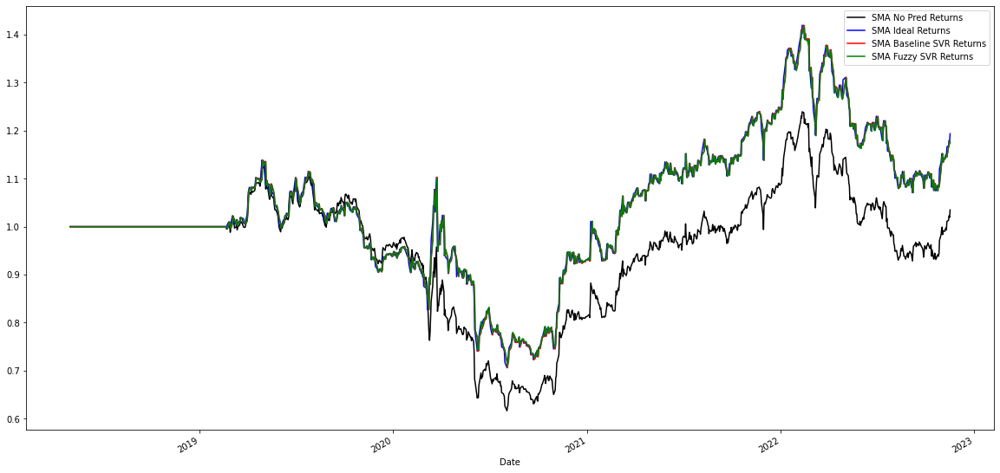

In [ ]:
plt.figure(figsize = (20,10))
df_sma_test['Returns'].plot(color='black', label= 'SMA No Pred Returns')
df_sma_test_ideal['Returns'].plot(color='b', label= 'SMA Ideal Returns')
df_sma_baseline['Returns'].plot(color='r', label='SMA Baseline SVR Returns')
df_sma_fuzzy['Returns'].plot(color='g', label='SMA Fuzzy SVR Returns')
plt.legend()
plt.show()

As seen, the fuzzy and baseline predictions perform quite well and almost match the ideal prediction with this SMA crossover trading algorithm.

In [ ]:
print(f"No forecast final return: {df_sma_test['Returns'].iat[-2]}")
print(f"Ideal forecast final return: {df_sma_test_ideal['Returns'].iat[-2]}")
print(f"Baseline SVR final return: {df_sma_baseline['Returns'].iat[-2]}")
print(f"Fuzzy SVR final return: {df_sma_fuzzy['Returns'].iat[-2]}")

No forecast final return: 1.0191999406011234
Ideal forecast final return: 1.1756191865946204
Baseline SVR final return: 1.1793354518918677
Fuzzy SVR final return: 1.1783079240997374


### MACD

#### Tuning windows with training data

MACD uses EMA to smooth the signal in two windows, a fast and slow average, like in the case of SMA crossover. But here, there is also an MACD smoothed signal which is just the smoothed value of the difference in the fast and slow EMA. The crossover of this smothed signal with the MACD gives the signal to buy/sell.

In [ ]:
def get_macd_trade_signals(df, slow, fast, smooth, ideal=True, trate=0.005):
    df['Fast_EMA'] = df['Close'].ewm(span = fast, adjust = False).mean()
    df['Slow_EMA'] = df['Close'].ewm(span = slow, adjust = False).mean()
    if(ideal):
        df = df.iloc[1:]
    else:
        df = df.iloc[:-1]
    df['MACD'] = df['Fast_EMA'] - df['Slow_EMA']
    df['MACD_Signal'] = df['MACD'].ewm(span = smooth, adjust = False).mean()
    df['Signal'] = 0.0
    df['Signal'] = np.where(df['MACD'] > df['MACD_Signal'], 1.0, 0.0)
    df['Position'] = df['Signal'].diff()
    # Need to set the first row of Position to 0. Otherwise it is nan from diff function.
    df['Position'].iloc[0]=0
    df = add_trade_signal(df)
    df['Returns'] = 1.0
    df = computereturns(df, trate)
    return df

Again, this method is highly sensitive to the choice of fast and slow window sizes. So, I'm using GA to find the best values optimizing for best mean returns on the training set.

In [ ]:
def fitness_func(solution, solution_idx):
    macd_df = get_macd_trade_signals(dbs_df.iloc[:training_data_len,:].copy(), solution[0], solution[1], solution[2], ideal=True)
    macd_df['Returns'] = 1.0
    macd_df = computereturns(macd_df,0.005)
    fitness = macd_df['Returns'].mean()
    print(solution, fitness)
    return fitness

**WARNING: The following GA tuning cell takes a long time to run.**



In [ ]:
fitness_function = fitness_func

num_generations = 25
num_parents_mating = 4

sol_per_pop = 8
num_genes = 3

init_range_low = 9
init_range_high = 500

parent_selection_type = "sss"
keep_parents = 1

crossover_type = "single_point"

mutation_type = "random"
mutation_percent_genes = 10

ga_instance = pygad.GA(num_generations=num_generations,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_function,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=init_range_low,
                       init_range_high=init_range_high,
                       parent_selection_type=parent_selection_type,
                       keep_parents=keep_parents,
                       crossover_type=crossover_type,
                       mutation_type=mutation_type,
                       mutation_percent_genes=mutation_percent_genes)

ga_instance.run()

0.0
[492.47426806  75.66794203 352.38990748] 1.355837558992207
0.0
[ 13.32779504 298.41007618 411.5892225 ] 0.6327317348574953
0.0
[130.66197403 192.62666754 340.16455765] 0.4033206366177917
0.0
[220.93068874 280.4446927  295.20202348] 0.42190579294002906
0.0
[155.96177194 274.35852864  29.10084909] 0.48410258681110085
0.0
[440.1378199  118.16875614 380.98652995] 0.7998461652603366
0.0
[225.70417271  52.07237312 433.78799111] 1.0127513062642075
0.0
[165.32674213 268.08505954  56.51879757] 0.6130740001950744
0.0
[225.70417271  52.07237312 433.56427097] 1.0141141826233893
0.0
[225.70417271 118.16875614 381.38968781] 1.174445310049191
0.0
[ 13.32779504 297.44319367 411.5892225 ] 0.6338693945500586
0.0
[ 12.7562439   75.66794203 352.38990748] 0.39596741498586463
0.0
[492.47426806  52.47184863 433.78799111] 1.4575224712807757
0.0
[226.67108831 118.16875614 380.98652995] 1.1926133168553041
0.0
[440.1378199  118.16875614 411.42341803] 0.9601989421612651
0.0
[492.47426806  53.45798099 352.3899

In [ ]:
solution, solution_fitness, solution_idx = ga_instance.best_solution()
print("Parameters of the best solution : {solution}".format(solution=solution))
print("Fitness value of the best solution = {solution_fitness}".format(solution_fitness=solution_fitness))

0.0
[491.59041788  53.28703802 435.41733461] 1.372035344251473
0.0
[491.59041788  51.45758019 434.97602895] 1.4478463499042966
0.0
[492.17095673  51.83628466 435.75066687] 1.4478463499042966
0.0
[492.83707901  51.83628466 434.87374358] 1.4478463499042966
0.0
[492.70550667  52.30451742 436.22620683] 1.4336933719044351
0.0
[491.59041788  52.30451742 434.60555419] 1.4735337550407763
0.0
[492.06464729  51.83628466 435.75066687] 1.4478463499042966
Parameters of the best solution : [492.70550667  52.30451742 435.04199785]
Fitness value of the best solution = 1.51513756986517


Using the obtained window sizes to generate trading signals in the next few cells.

In [ ]:
# macd_ga = solution
macd_ga = [492.70550667,  52.30451742, 435.04199785] # providing value from GA tuning directly for easy reruns.
macd_df = dbs_df.iloc[:training_data_len,:].copy()
macd_df = get_macd_trade_signals(macd_df, macd_ga[0], macd_ga[1], macd_ga[2], ideal=False)
macd_ideal_df = dbs_df.iloc[:training_data_len,:].copy()
macd_ideal_df = get_macd_trade_signals(macd_ideal_df, macd_ga[0], macd_ga[1], macd_ga[2], ideal=True)
macd_df.head()

0.0
0.0


,Open,High,Low,Close,Volume,Dividends,Stock Splits,Fast_EMA,Slow_EMA,MACD,MACD_Signal,Signal,Position,Trade,Returns
Date,,,,,,,,,,,,,,,
2000-01-03 00:00:00+08:00,12.207427,12.251980,12.029217,12.162874,748000,0.0,0,12.162874,12.162874,0.000000,0.000000,0.0,0.0,0.0,1.0
2000-01-04 00:00:00+08:00,12.162878,12.162878,11.583693,11.717351,2405000,0.0,0,12.146158,12.161069,-0.014911,-0.000068,0.0,0.0,0.0,1.0
2000-01-05 00:00:00+08:00,11.494592,11.494592,10.959960,10.959960,3892000,0.0,0,12.101652,12.156204,-0.054552,-0.000318,0.0,0.0,0.0,1.0
2000-01-06 00:00:00+08:00,11.138171,11.227277,10.425328,10.737197,2522000,0.0,0,12.050457,12.150455,-0.099998,-0.000775,0.0,0.0,0.0,1.0
2000-01-07 00:00:00+08:00,10.737195,11.138169,10.603537,11.138169,3649000,0.0,0,12.016228,12.146355,-0.130127,-0.001369,0.0,0.0,0.0,1.0


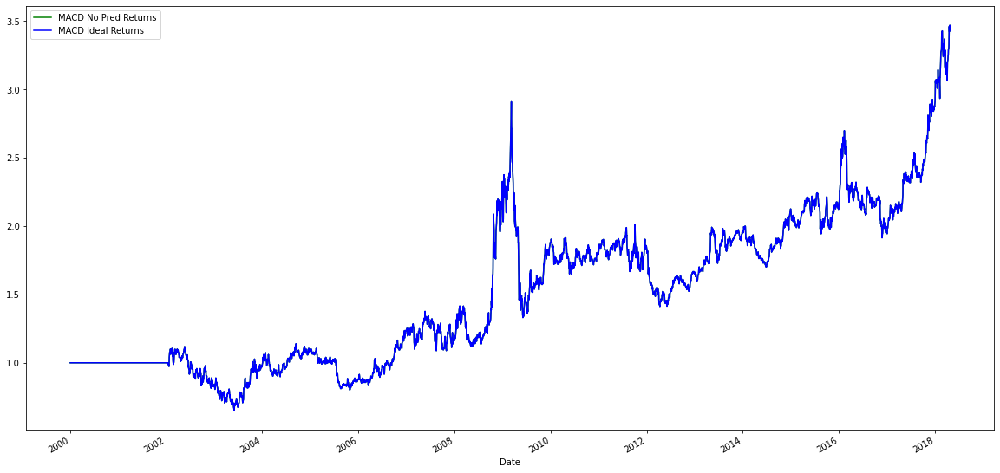

In [ ]:
plt.figure(figsize = (20,10))
macd_df['Returns'].plot(color='g', label= 'MACD No Pred Returns')
macd_ideal_df['Returns'].plot(color='b', label= 'MACD Ideal Returns')
plt.legend()
plt.show()

Because the MACD windows chosen are quite large, the 1 day difference in the price values get smoothed out and don't contribute much to the difference between the ideal and no prediction returns in this case. Nevertheless, it provides adequate performance overall, resulting in a final return well over 1.

#### With testing data

In [ ]:
# macd_ga = solution
macd_ga = [492.70550667,  52.30451742, 435.04199785]
macd_test_df = dbs_df.iloc[training_data_len+1:,:].copy()
macd_test_df = get_macd_trade_signals(macd_test_df, macd_ga[0], macd_ga[1], macd_ga[2], ideal=False)

macd_test_ideal_df = dbs_df.iloc[training_data_len+1:,:].copy()
macd_test_ideal_df = get_macd_trade_signals(macd_test_ideal_df, macd_ga[0], macd_ga[1], macd_ga[2], ideal=True)

df_macd_baseline = dbs_df.iloc[training_data_len+1:,:].copy()
df_macd_baseline.drop(columns=['Close'])
df_macd_baseline['Close'] = baseline_predictions
df_macd_baseline = get_macd_trade_signals(df_macd_baseline, macd_ga[0], macd_ga[1], macd_ga[2], ideal=True)

df_macd_fuzzy = dbs_df.iloc[training_data_len+1:,:].copy()
df_macd_fuzzy.drop(columns=['Close'])
df_macd_fuzzy['Close'] = fuzzy_predictions
df_macd_fuzzy = get_macd_trade_signals(df_macd_fuzzy, macd_ga[0], macd_ga[1], macd_ga[2], ideal=True)

0.0
0.0
0.0
0.0


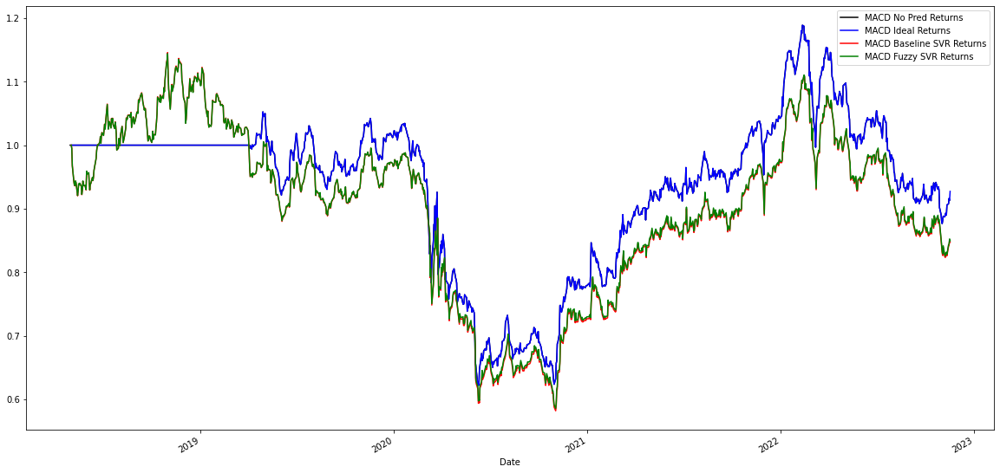

In [ ]:
plt.figure(figsize = (20,10))
macd_test_df['Returns'].plot(color='black', label= 'MACD No Pred Returns')
macd_test_ideal_df['Returns'].plot(color='b', label= 'MACD Ideal Returns')
df_macd_baseline['Returns'].plot(color='r', label='MACD Baseline SVR Returns')
df_macd_fuzzy['Returns'].plot(color='g', label='MACD Fuzzy SVR Returns')
plt.legend()
plt.show()

In [ ]:
print(f"No forecast final return: {macd_test_df['Returns'].iat[-2]}")
print(f"Ideal forecast final return: {macd_test_ideal_df['Returns'].iat[-2]}")
print(f"Baseline SVR final return: {df_macd_baseline['Returns'].iat[-2]}")
print(f"Fuzzy SVR final return: {df_macd_fuzzy['Returns'].iat[-2]}")

No forecast final return: 0.916068853377188
Ideal forecast final return: 0.9132044948745895
Baseline SVR final return: 0.8500351943309602
Fuzzy SVR final return: 0.8524077514239257


As seen, the parameters do not work well in the test set despite showing good results in the train set. More tuning and running GA for more generations might be required. It could also just be because of the test set and stock in question does not match the training distribution. As said, it has the COVID years as well.

In [ ]:
# macd_ga = solution
macd_ga = [300, 100, 200] # Hand crafted solution
macd_test_df = dbs_df.iloc[training_data_len+1:,:].copy()
macd_test_df = get_macd_trade_signals(macd_test_df, macd_ga[0], macd_ga[1], macd_ga[2], ideal=False)

macd_test_ideal_df = dbs_df.iloc[training_data_len+1:,:].copy()
macd_test_ideal_df = get_macd_trade_signals(macd_test_ideal_df, macd_ga[0], macd_ga[1], macd_ga[2], ideal=True)

df_macd_baseline = dbs_df.iloc[training_data_len+1:,:].copy()
df_macd_baseline.drop(columns=['Close'])
df_macd_baseline['Close'] = baseline_predictions
df_macd_baseline = get_macd_trade_signals(df_macd_baseline, macd_ga[0], macd_ga[1], macd_ga[2], ideal=True)

df_macd_fuzzy = dbs_df.iloc[training_data_len+1:,:].copy()
df_macd_fuzzy.drop(columns=['Close'])
df_macd_fuzzy['Close'] = fuzzy_predictions
df_macd_fuzzy = get_macd_trade_signals(df_macd_fuzzy, macd_ga[0], macd_ga[1], macd_ga[2], ideal=True)

0.0
0.0
0.0
0.0


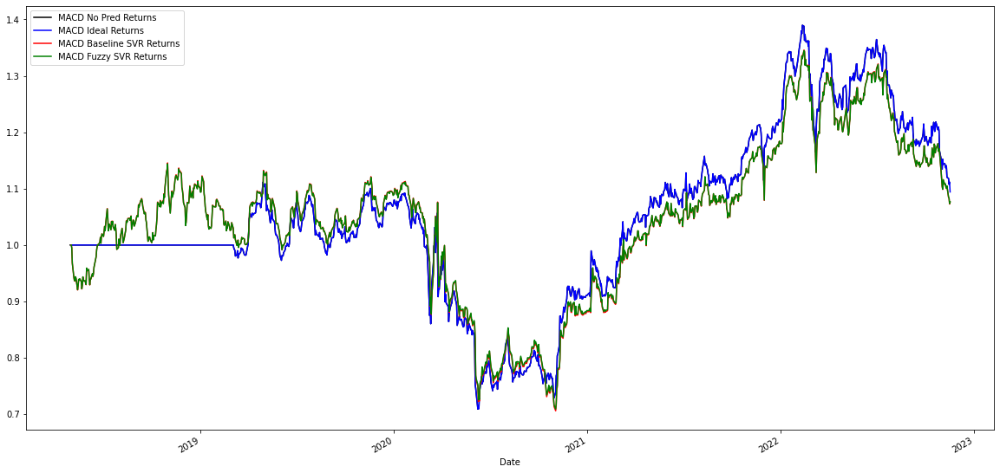

In [ ]:
plt.figure(figsize = (20,10))
macd_test_df['Returns'].plot(color='black', label= 'MACD No Pred Returns')
macd_test_ideal_df['Returns'].plot(color='b', label= 'MACD Ideal Returns')
df_macd_baseline['Returns'].plot(color='r', label='MACD Baseline SVR Returns')
df_macd_fuzzy['Returns'].plot(color='g', label='MACD Fuzzy SVR Returns')
plt.legend()
plt.show()

In [ ]:
print(f"No forecast final return: {macd_test_df['Returns'].iat[-2]}")
print(f"Ideal forecast final return: {macd_test_ideal_df['Returns'].iat[-2]}")
print(f"Baseline SVR final return: {df_macd_baseline['Returns'].iat[-2]}")
print(f"Fuzzy SVR final return: {df_macd_fuzzy['Returns'].iat[-2]}")

No forecast final return: 1.1077503438602774
Ideal forecast final return: 1.111214050878036
Baseline SVR final return: 1.0726801446164873
Fuzzy SVR final return: 1.0732904506909158


As seen, the fuzzy and baseline prediction returns almost match the ideal prediction and out performs no prediction. As mentioned earlier, because of the length of the windows, smaller deviations in the prediction are smoothed away and do not affect the trading signal.

The Fuzzy SVR provides interpretability while also performing as well as the baseline model.

## More Analysis

In [ ]:
# macd_ga = solution
macd_ga = [26, 12, 9]

macd_test_ideal_df = dbs_df.iloc[training_data_len+1:,:].copy()
macd_test_ideal_df = get_macd_trade_signals(macd_test_ideal_df, macd_ga[0], macd_ga[1], macd_ga[2], ideal=True)

0.0


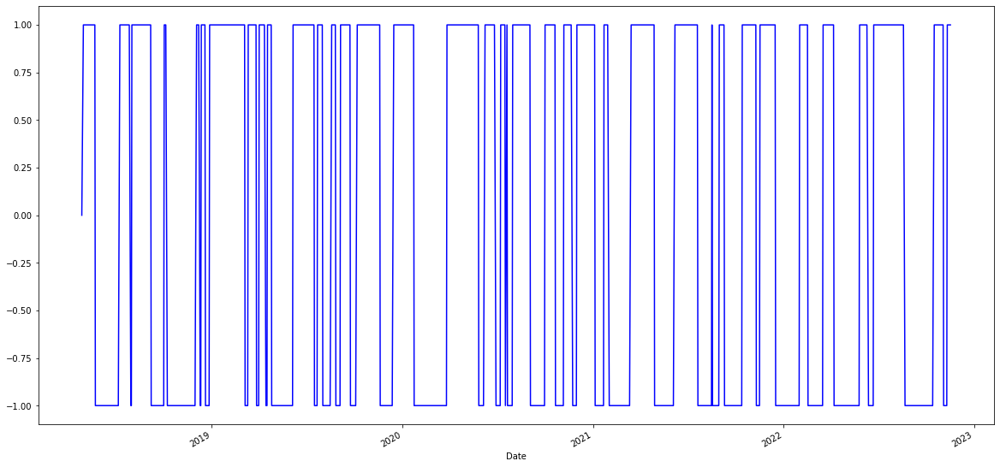

In [ ]:
plt.figure(figsize = (20,10))
macd_test_ideal_df['Trade'].plot(color='b', label= 'MACD Trade')
plt.show()

In [ ]:
df=dbs_df.iloc[training_data_len:,:].copy()
fast = 20
slow = 70
# create 20 days simple moving average column
df['Fast_SMA'] = df['Close'].rolling(window = fast, min_periods = 1, closed='left').mean()
# create 50 days simple moving average column
df['Slow_SMA'] = df['Close'].rolling(window = slow, min_periods = 1, closed='left').mean()
# display first few rows
df.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Fast_SMA,Slow_SMA
Date,,,,,,,,,
2018-04-27 00:00:00+08:00,23.611881,23.643406,23.446378,23.643406,5278100,0.0,0,NaN,NaN
2018-04-30 00:00:00+08:00,24.116271,24.415753,23.982292,24.305418,7770197,0.0,0,23.643406,23.643406
2018-05-02 00:00:00+08:00,24.494568,24.652191,24.045343,24.124155,9388900,0.0,0,23.974412,23.974412
2018-05-03 00:00:00+08:00,23.387050,23.499217,23.162713,23.459158,11557410,0.5,0,24.024326,24.024326
2018-05-04 00:00:00+08:00,23.515241,23.515241,22.882291,23.074579,7381550,0.0,0,23.883034,23.883034


In [ ]:
df_ideal=dbs_df.iloc[training_data_len:,:].copy()
# create 20 days simple moving average column
df_ideal['Fast_SMA'] = df_ideal['Close'].rolling(window = fast, min_periods = 1).mean()
# create 50 days simple moving average column
df_ideal['Slow_SMA'] = df_ideal['Close'].rolling(window = slow, min_periods = 1,).mean()
# display first few rows
df_ideal.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Fast_SMA,Slow_SMA
Date,,,,,,,,,
2018-04-27 00:00:00+08:00,23.611881,23.643406,23.446378,23.643406,5278100,0.0,0,23.643406,23.643406
2018-04-30 00:00:00+08:00,24.116271,24.415753,23.982292,24.305418,7770197,0.0,0,23.974412,23.974412
2018-05-02 00:00:00+08:00,24.494568,24.652191,24.045343,24.124155,9388900,0.0,0,24.024326,24.024326
2018-05-03 00:00:00+08:00,23.387050,23.499217,23.162713,23.459158,11557410,0.5,0,23.883034,23.883034
2018-05-04 00:00:00+08:00,23.515241,23.515241,22.882291,23.074579,7381550,0.0,0,23.721343,23.721343


In [ ]:
df.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Fast_SMA,Slow_SMA
Date,,,,,,,,,
2018-04-27 00:00:00+08:00,23.611881,23.643406,23.446378,23.643406,5278100,0.0,0,NaN,NaN
2018-04-30 00:00:00+08:00,24.116271,24.415753,23.982292,24.305418,7770197,0.0,0,23.643406,23.643406
2018-05-02 00:00:00+08:00,24.494568,24.652191,24.045343,24.124155,9388900,0.0,0,23.974412,23.974412
2018-05-03 00:00:00+08:00,23.387050,23.499217,23.162713,23.459158,11557410,0.5,0,24.024326,24.024326
2018-05-04 00:00:00+08:00,23.515241,23.515241,22.882291,23.074579,7381550,0.0,0,23.883034,23.883034


In [ ]:
df = df.iloc[1: , :]
df.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Fast_SMA,Slow_SMA
Date,,,,,,,,,
2018-04-30 00:00:00+08:00,24.116271,24.415753,23.982292,24.305418,7770197,0.0,0,23.643406,23.643406
2018-05-02 00:00:00+08:00,24.494568,24.652191,24.045343,24.124155,9388900,0.0,0,23.974412,23.974412
2018-05-03 00:00:00+08:00,23.387050,23.499217,23.162713,23.459158,11557410,0.5,0,24.024326,24.024326
2018-05-04 00:00:00+08:00,23.515241,23.515241,22.882291,23.074579,7381550,0.0,0,23.883034,23.883034
2018-05-07 00:00:00+08:00,23.234821,23.250846,23.066570,23.210785,4528000,0.0,0,23.721343,23.721343


In [ ]:
df_ideal = df_ideal.iloc[1: , :]
df_ideal.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Fast_SMA,Slow_SMA
Date,,,,,,,,,
2018-04-30 00:00:00+08:00,24.116271,24.415753,23.982292,24.305418,7770197,0.0,0,23.974412,23.974412
2018-05-02 00:00:00+08:00,24.494568,24.652191,24.045343,24.124155,9388900,0.0,0,24.024326,24.024326
2018-05-03 00:00:00+08:00,23.387050,23.499217,23.162713,23.459158,11557410,0.5,0,23.883034,23.883034
2018-05-04 00:00:00+08:00,23.515241,23.515241,22.882291,23.074579,7381550,0.0,0,23.721343,23.721343
2018-05-07 00:00:00+08:00,23.234821,23.250846,23.066570,23.210785,4528000,0.0,0,23.636250,23.636250


There many moving average strategies that can be developed to generate trade signals. here we will use a simple moving average crossover strategy based on the SMAs we computed. A moving average can be use to indicate price trends. A crossover occurs when a faster or shorter moving average, such as the 20 days SMA crosses a slower or longer moving average, such as the 100 days SMA. This crossover  point can be used as a  indicator to buy or sell a stock.

First we create a new column ‘Signal’ such that if Fast_SMA is greater than Slow_SMA then set to 1 else set to 0.


In [ ]:
df['Signal'] = 0.0
df['Signal'] = np.where(df['Fast_SMA'] > df['Slow_SMA'], 1.0, 0.0)

In [ ]:
df_ideal['Signal'] = 0.0
df_ideal['Signal'] = np.where(df_ideal['Fast_SMA'] > df_ideal['Slow_SMA'], 1.0, 0.0)

We now need to generate the buy and sell from the ‘Signal’ values. Crossover happens when the Fast_SMA and the Slow_SMA cross,  the ‘Signal’ changes from 0 to 1, or from 1 to 0. Thus we can just create a ‘Position’ value to indicate a day-to-day difference of the ‘Signal’ column.

‘Position’ = 1 implies that Signal changed from 0 to 1, meaning a faster moving average has crossed a slower moving average. This indicates a bull or up trend in the price and thus this is a buy signal.

‘Position’ = -1 implies that  Signal changed from 1 to 0, meaning a faster moving average has crossed below a slower moving average. This indicates a bear or down trend in the price and thus this is a sell signal.

In [ ]:
df['Position'] = df['Signal'].diff()
# Need to set the first row of Position to 0. Otherwise it is nan from diff function.
df['Position'].iloc[0]=0
# display first few rows
df.head()


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,Open,High,Low,Close,Volume,Dividends,Stock Splits,Fast_SMA,Slow_SMA,Signal,Position
Date,,,,,,,,,,,
2018-04-30 00:00:00+08:00,24.116271,24.415753,23.982292,24.305418,7770197,0.0,0,23.643406,23.643406,0.0,0.0
2018-05-02 00:00:00+08:00,24.494568,24.652191,24.045343,24.124155,9388900,0.0,0,23.974412,23.974412,0.0,0.0
2018-05-03 00:00:00+08:00,23.387050,23.499217,23.162713,23.459158,11557410,0.5,0,24.024326,24.024326,0.0,0.0
2018-05-04 00:00:00+08:00,23.515241,23.515241,22.882291,23.074579,7381550,0.0,0,23.883034,23.883034,0.0,0.0
2018-05-07 00:00:00+08:00,23.234821,23.250846,23.066570,23.210785,4528000,0.0,0,23.721343,23.721343,0.0,0.0


In [ ]:
df_ideal['Position'] = df_ideal['Signal'].diff()
# Need to set the first row of Position to 0. Otherwise it is nan from diff function.
df_ideal['Position'].iloc[0]=0
# display first few rows
df_ideal.head()


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,Open,High,Low,Close,Volume,Dividends,Stock Splits,Fast_SMA,Slow_SMA,Signal,Position
Date,,,,,,,,,,,
2018-04-30 00:00:00+08:00,24.116271,24.415753,23.982292,24.305418,7770197,0.0,0,23.974412,23.974412,0.0,0.0
2018-05-02 00:00:00+08:00,24.494568,24.652191,24.045343,24.124155,9388900,0.0,0,24.024326,24.024326,0.0,0.0
2018-05-03 00:00:00+08:00,23.387050,23.499217,23.162713,23.459158,11557410,0.5,0,23.883034,23.883034,0.0,0.0
2018-05-04 00:00:00+08:00,23.515241,23.515241,22.882291,23.074579,7381550,0.0,0,23.721343,23.721343,0.0,0.0
2018-05-07 00:00:00+08:00,23.234821,23.250846,23.066570,23.210785,4528000,0.0,0,23.636250,23.636250,0.0,0.0


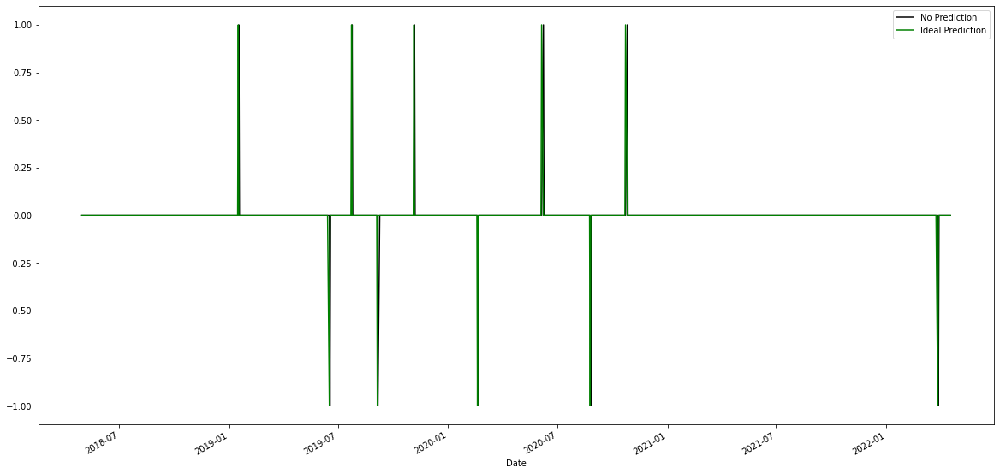

In [ ]:
# Plot the positions
plt.figure(figsize = (20,10))
df.iloc[0:1000]['Position'].plot(color = 'k', label= 'No Prediction')
df_ideal.iloc[0:1000]['Position'].plot(color = 'g', label= 'Ideal Prediction')
plt.legend()
plt.show()

Next we need to change the position signal to trade signals. Although position can give us this information, we want the change in the trade signal, which is the change from -1 to 1 to indicate a buy, and 1 to -1 to indicate a sell. This is for computing the Multiplicative Portfolio Returns.

0.0
0.0


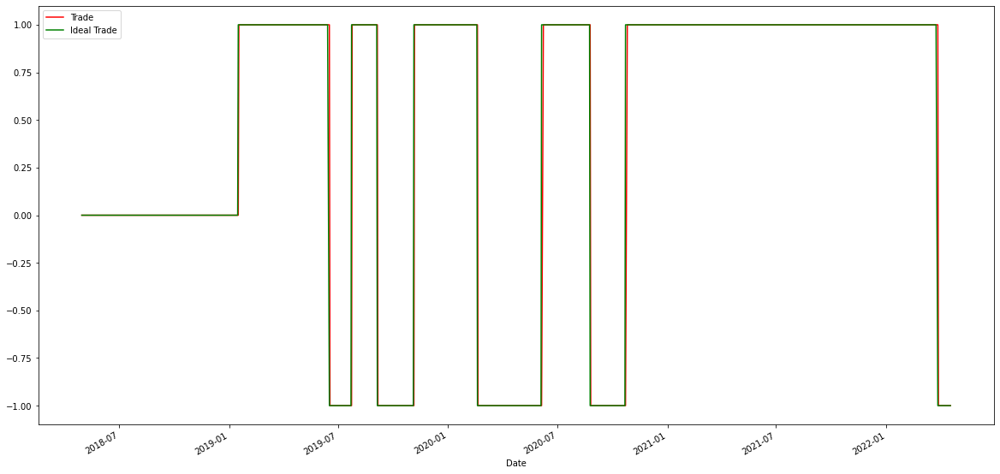

In [ ]:


plt.figure(figsize = (20,10))
df['Trade'] = df['Position']
prevrow = df.iloc[0]
print(prevrow['Position'])
for index, row in df.iloc[1:].iterrows():
  if row['Trade']==0:
    if prevrow['Trade']!=0:
      df.at[index,'Trade']=prevrow['Trade']
      row['Trade']=prevrow['Trade']
  prevrow=row
df.iloc[0:1000]['Trade'].plot(color = 'r', label= 'Trade')

df_ideal['Trade'] = df_ideal['Position']
prevrow = df_ideal.iloc[0]
print(prevrow['Position'])
for index, row in df_ideal.iloc[1:].iterrows():
  if row['Trade']==0:
    if prevrow['Trade']!=0:
      df_ideal.at[index,'Trade']=prevrow['Trade']
      row['Trade']=prevrow['Trade']
  prevrow=row
df_ideal.iloc[0:1000]['Trade'].plot(color = 'g', label= 'Ideal Trade')
plt.legend()
plt.show()

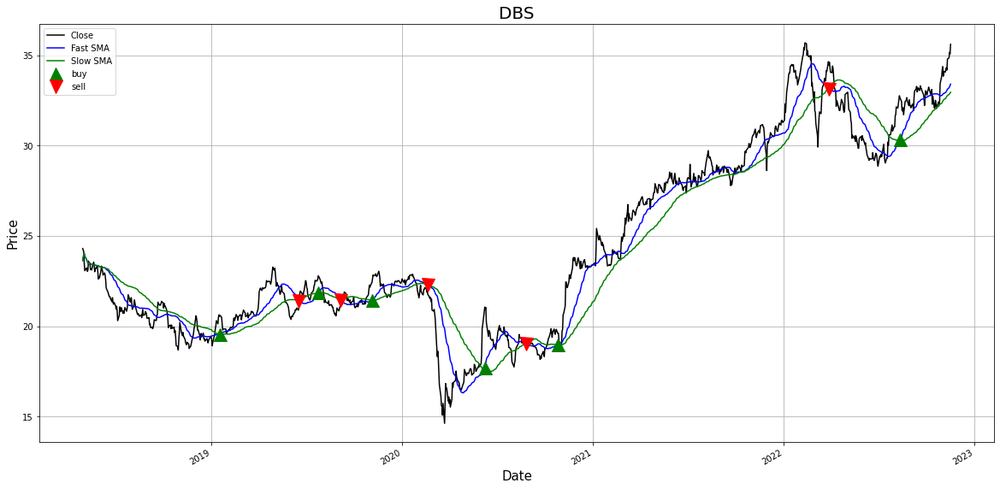

In [ ]:
# plot close price, Fast and Slow simple moving averages
def plotprice(df):
  plt.figure(figsize = (20,10))
  df['Close'].plot(color = 'k', label= 'Close')
  df['Fast_SMA'].plot(color = 'b', label = 'Fast SMA')
  df['Slow_SMA'].plot(color = 'g', label = 'Slow SMA')
  # plot buy signals
  plt.plot(df[df['Position'] == 1].index, df['Fast_SMA'][df['Position'] == 1], '^', markersize = 15, color = 'g', label = 'buy')
  # plot sell signals
  plt.plot(df[df['Position'] == -1].index, df['Fast_SMA'][df['Position'] == -1], 'v', markersize = 15, color = 'r', label = 'sell')
  plt.ylabel('Price', fontsize = 15 )
  plt.xlabel('Date', fontsize = 15 )
  plt.title('DBS', fontsize = 20)
  plt.legend()
  plt.grid()
  plt.show()

plotprice(df)

It is not very clear in the plot above since it included the prices of many years. Lets zoom in to take a closer look.

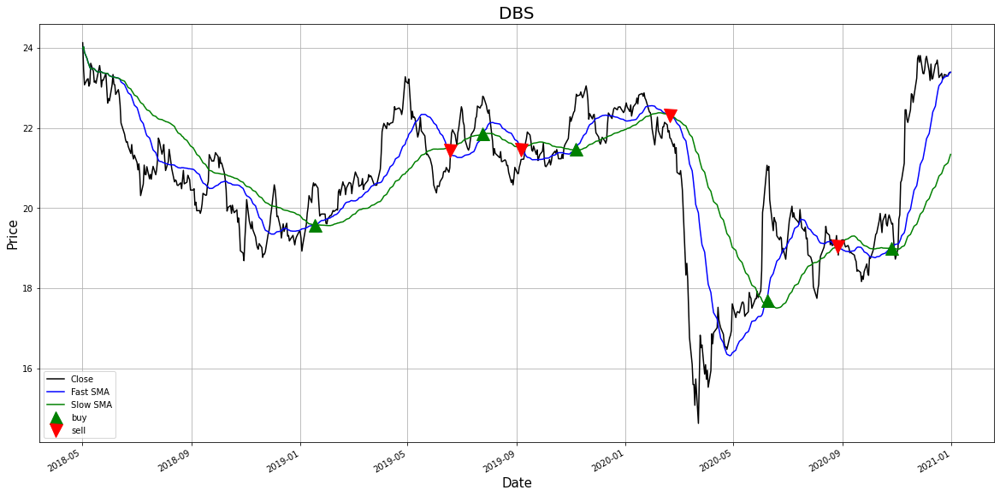

In [ ]:
sdf=df.loc['2018-05-01':'2020-12-31']
plotprice(sdf)


Notice that some of the buy and sell are performed at almost the same price. Since each trade incurs a transaction cost, trades at around the same price will result in losses. Hence a better trading strategy can be implemented, such as the introduction of a moving average band to reduce the number of trades around the same price. Refer to the paper on this for more details.

## Alternate methods tried (Graveyard)

### LSTM

In [ ]:
latent_dim = 64
model = keras.Sequential()
model.add(layers.Bidirectional(layers.LSTM(latent_dim, return_sequences=True, input_shape=(x_train.shape[1], 1), activation="relu")))
model.add(layers.Dropout(0.1))
model.add(layers.Bidirectional(layers.LSTM(latent_dim, return_sequences=False, activation="relu")))
model.add(layers.Dropout(0.1))
# model.add(layers.LSTM(latent_dim))
# model.add(layers.Dense(50))
model.add(layers.Dense(16))
model.add(layers.Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# model.summary()

n_epochs = 50
valid_losses = []
train_losses = []
patience = 10
nochange = 0
prev_best = sys.maxsize
best_model_filename = "lstm_best_val_loss"
for epoch in range(n_epochs):
    print(f"Epoch {epoch + 1}:")
    index = random.randrange(3)
    x_train, y_train = x_train_folds[index], y_train_folds[index]
    x_val, y_val = x_val_folds[index], y_val_folds[index]
    history = model.fit(x_train, y_train, batch_size= 1, epochs=1)
    train_losses.append(history)
    val_loss = model.evaluate(x_val, y_val)
    valid_losses.append(val_loss)
    print(f"Validation loss: {val_loss}\n")
    if(val_loss < prev_best):
        prev_best = val_loss
        nochange = 0
        model.save(best_model_filename)
    else:
        nochange +=1
    if(nochange > patience):
        print(f"Stopping training since validation loss has not decreased for the last {patience} epochs.")
        break

Epoch 1:
36/36 [==============================] - 1s 7ms/step - loss: 0.0109
Validation loss: 0.01091278251260519

Epoch 2:
36/36 [==============================] - 0s 7ms/step - loss: 0.0101
Validation loss: 0.010051855817437172

Epoch 3:
36/36 [==============================] - 0s 7ms/step - loss: 0.0101
Validation loss: 0.010125569067895412

Epoch 4:
36/36 [==============================] - 0s 7ms/step - loss: 0.0054
Validation loss: 0.005375168286263943

Epoch 5:
36/36 [==============================] - 0s 8ms/step - loss: 0.0111
Validation loss: 0.01106957346200943

Epoch 6:
36/36 [==============================] - 0s 7ms/step - loss: 0.0110
Validation loss: 0.011000038124620914

Epoch 7:
36/36 [==============================] - 0s 7ms/step - loss: 0.0102
Validation loss: 0.010218526236712933

Epoch 8:
1154/2287 [==============>...............] - ETA: 36s - loss: 0.0106

KeyboardInterrupt: ignored

In [ ]:
train_losses = [train_losses[i].history['loss'][0] for i in range(len(train_losses))]
plt.plot(train_losses)
plt.plot(valid_losses)
plt.legend(['Train Loss', 'Val Loss'], loc='upper right')
plt.show()

In [ ]:
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)
best_model = keras.models.load_model(best_model_filename)
best_preds = best_model.predict(x_test)
best_preds = scaler.inverse_transform(best_preds)

In [ ]:

# rms_last = mean_squared_error(y_test, predictions, squared=False)

# rms_best = mean_squared_error(y_test, best_preds, squared=False)

# shifted_prices = values[training_data_len -1 : -1]
# noise = np.random.normal(loc=0, scale=1, size=len(y_test))
# random_walk_pred = shifted_prices + np.array(noise)
# rw_rms = mean_squared_error(y_test, random_walk_pred, squared=False)
# shifted_rms = mean_squared_error(y_test, shifted_prices, squared=False)

# print(f"Last RMSE: {rms_last}")
# print(f"Best RMSE: {rms_best}")
# print(f"Random Walk RMSE: {rw_rms}")
# print(f"Shifted RMSE: {shifted_rms}")

In [ ]:
# predictions = model.predict(x_test)
predictions = np.reshape(predictions, (predictions.shape[0]))
# print(predictions.shape)
# predictions = scaler.inverse_transform(predictions)
shifted_prices = vals[training_data_len:-1]
# print(shifted_prices.shape)
actual_prices = vals[training_data_len+1:]
preds = shifted_prices + predictions
# print(preds.shape, actual_prices.shape)
rms_last = mean_squared_error(actual_prices, preds, squared=False)
# best_model = keras.models.load_model(best_model_filename)
# best_preds = best_model.predict(x_test)
best_preds = np.reshape(best_preds, (best_preds.shape[0]))
best_price_preds = shifted_prices + best_preds
# best_preds = scaler.inverse_transform(best_preds)
rms_best = mean_squared_error(actual_prices, best_price_preds, squared=False)

noise = np.random.normal(loc=0, scale=1, size=len(y_test))
random_walk_pred = shifted_prices + np.array(noise)
rw_rms = mean_squared_error(actual_prices, random_walk_pred, squared=False)
shifted_rms = mean_squared_error(actual_prices, shifted_prices, squared=False)

print(f"Last RMSE: {rms_last}")
print(f"Best RMSE: {rms_best}")
print(f"Random Walk RMSE: {rw_rms}")
print(f"Shifted RMSE: {shifted_rms}")

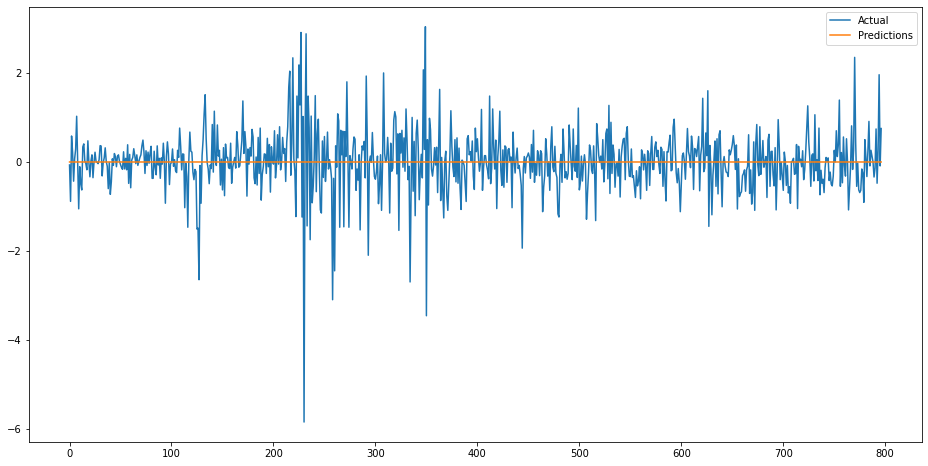

In [ ]:
plt.figure(figsize=(16,8))
plt.plot(y_test)
plt.plot(best_preds)
plt.legend(['Actual', 'Predictions'], loc='upper right')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


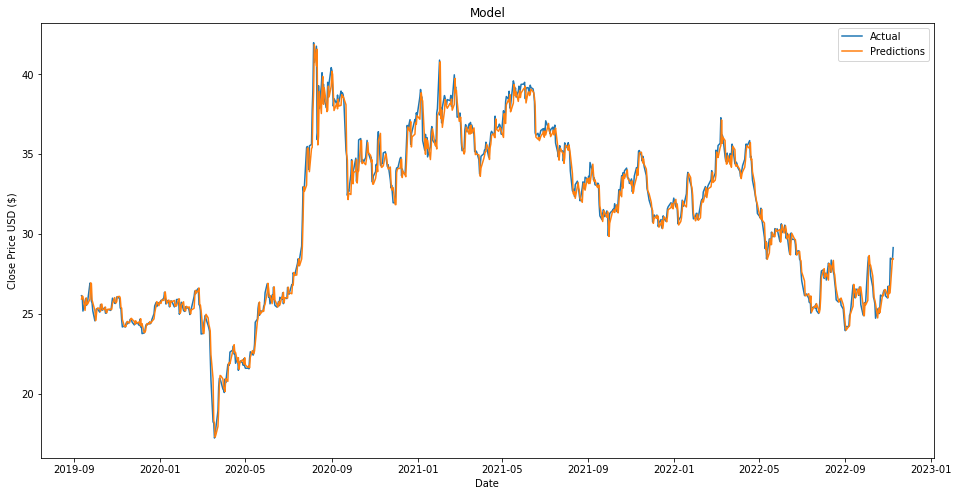

In [ ]:
data = stock_data.filter(['Close'])
train = data[:training_data_len]
validation = data[training_data_len:]
validation['Predictions'] = best_preds
plt.figure(figsize=(16,8))
plt.title('Model')
plt.xlabel('Date')
plt.ylabel('Close Price USD ($)')
# plt.plot(train)
plt.plot(validation[['Close', 'Predictions']])
plt.legend(['Actual', 'Predictions'], loc='upper right')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


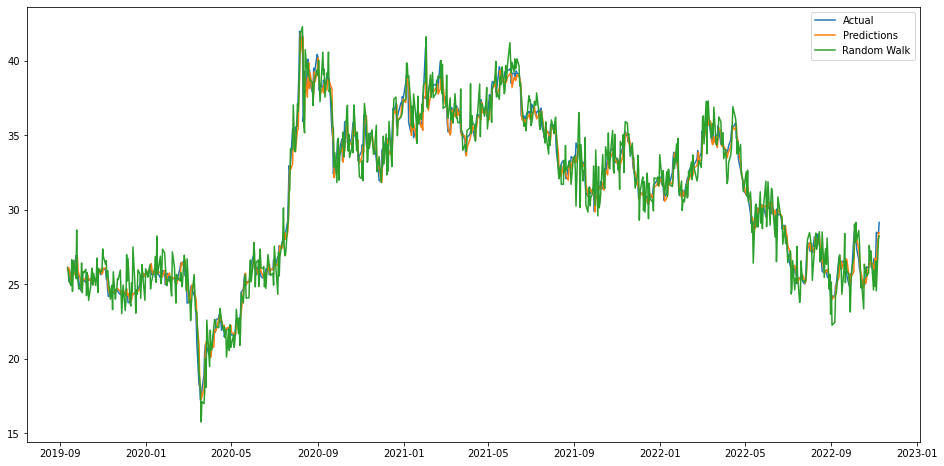

In [ ]:
random_walk_pred = shifted_prices + np.array(noise)
validation['random_walk'] = random_walk_pred
plt.figure(figsize=(16,8))
plt.plot(validation[['Close', 'Predictions', 'random_walk']])
plt.legend(['Actual', 'Predictions', 'Random Walk'], loc='upper right')
plt.show()

In [ ]:
rw_rms = mean_squared_error(y_test, random_walk_pred, squared=False)
print("Random Walk RMSE:", rw_rms)
print("LSTM RMSE:", rms)

Random Walk RMSE: 1.1850703228362418
LSTM RMSE: 0.810381789955145


### ARIMA modeling

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=7359.481, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2008.545, Time=0.82 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=inf, Time=3.73 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-1576.529, Time=0.90 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=inf, Time=2.98 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-3861.965, Time=1.18 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=inf, Time=4.31 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=-14892.127, Time=2.37 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=-14894.106, Time=1.92 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-14894.982, Time=2.19 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-14885.028, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-14892.714, Time=2.95 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-14894.573, Time=0.92 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : A

/usr/local/lib/python3.7/dist-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


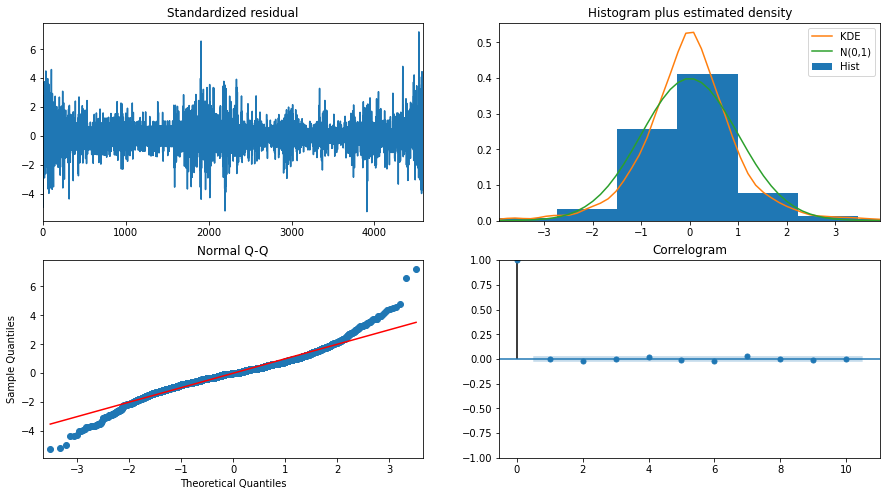

In [ ]:
model_autoARIMA = auto_arima(train_data.reshape(train_data.shape[0]), start_p=0, start_q=0,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0,
                      D=0,
                      trace=True,
                      error_action='ignore',
                      suppress_warnings=True,
                      stepwise=True)
print(model_autoARIMA.summary())
model_autoARIMA.plot_diagnostics(figsize=(15,8))
plt.show()

In [ ]:
#Modeling
# Build Model
model = ARIMA(train_data, order=(0,0,1))
fitted = model.fit()
print(fitted.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 4592
Model:                 ARIMA(0, 0, 1)   Log Likelihood                7450.491
Date:                Sun, 20 Nov 2022   AIC                         -14894.982
Time:                        09:45:34   BIC                         -14875.686
Sample:                             0   HQIC                        -14888.189
                               - 4592                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5370      0.001    722.938      0.000       0.536       0.538
ma.L1          0.0520      0.010      5.361      0.000       0.033       0.071
sigma2         0.0023   2.88e-05     79.302      0.0

Forecast: [0.54778189 0.53698908 0.53698908 ... 0.53698908 0.53698908 0.53698908]


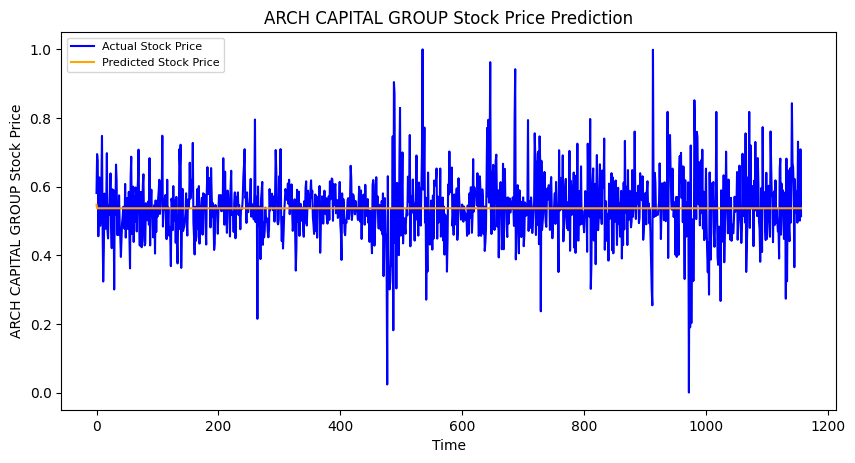

In [ ]:
# Forecast
fc = fitted.forecast(len(test_data), alpha=0.05)  # 95% conf
print("Forecast:", fc)
# print("Forecast shape", fc.shape)
# Make as pandas series
# fc = fc.reshape(-1,1)
# print("fc_series shape:", fc.shape)
# fc_series = scaler.inverse_transform(fc)
# fc_series = pd.Series(fc_series.reshape(fc_series.shape[0]))
fc_series = pd.Series(fc)
# print("Pandas forecast:", fc_series)
# lower_series = pd.Series(conf[:, 0], index=test_data.index)
# upper_series = pd.Series(conf[:, 1], index=test_data.index)
# Plot
plt.figure(figsize=(10,5), dpi=100)
# plt.plot(train_data, label='training data')
plt.plot(test_data, color = 'blue', label='Actual Stock Price')
plt.plot(fc_series, color = 'orange',label='Predicted Stock Price')
# plt.fill_between(lower_series.index, lower_series, upper_series,
                #  color='k', alpha=.10)
plt.title('DBS Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('DBS Stock Price')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [ ]:
# predictions = model.predict(x_test)
predictions = fc
print(predictions.shape)
# predictions = scaler.inverse_transform(predictions)
shifted_prices = scaled_data[training_data_len-window_len-1:-1]
shifted_prices = shifted_prices.reshape(shifted_prices.shape[0])
print(shifted_prices.shape)
actual_prices = test_data
actual_prices = actual_prices.reshape(actual_prices.shape[0])
print(actual_prices.shape)
preds = predictions
# print(preds.shape, actual_prices.shape)
rms_last = mean_squared_error(actual_prices, preds, squared=False)
# best_model = keras.models.load_model(best_model_filename)
# best_preds = best_model.predict(x_test)
# best_preds = np.reshape(best_preds, (best_preds.shape[0]))
# best_price_preds = shifted_prices + best_preds
# best_preds = scaler.inverse_transform(best_preds)
# rms_best = mean_squared_error(actual_prices, best_price_preds, squared=False)

# noise = np.random.normal(loc=0, scale=1, size=len(test_data))
# random_walk_pred = shifted_prices + np.array(noise)
# rw_rms = mean_squared_error(actual_prices, random_walk_pred, squared=False)
shifted_rms = mean_squared_error(actual_prices, shifted_prices, squared=False)

print(f"Last RMSE: {rms_last}")
# print(f"Best RMSE: {rms_best}")
# print(f"Random Walk RMSE: {rw_rms}")
print(f"Shifted RMSE: {shifted_rms}")

(1157,)
(1157,)
(1157,)
Last RMSE: 0.09611308614149659
Shifted RMSE: 0.13539055729184316


In [ ]:
max(fc)

0.5477818907189148

In [ ]:
dbs_df.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2000-01-03 00:00:00+08:00,12.207435,12.251988,12.029224,12.162882,748000,0.0,0
2000-01-04 00:00:00+08:00,12.162878,12.162878,11.583693,11.717351,2405000,0.0,0
2000-01-05 00:00:00+08:00,11.494587,11.494587,10.959955,10.959955,3892000,0.0,0
2000-01-06 00:00:00+08:00,11.138168,11.227274,10.425325,10.737194,2522000,0.0,0
2000-01-07 00:00:00+08:00,10.737196,11.138170,10.603538,11.138170,3649000,0.0,0


Take cross validation image from https://medium.com/@soumyachess1496/cross-validation-in-time-series-566ae4981ce4

## References

[1] Ang, K. K., & Quek, C. (2006). Stock Trading Using RSPOP: A Novel Rough Set-Based Neuro-Fuzzy Approach. IEEE Trans. Neural Netw., 17(5), 1301-1315. doi:http://dx.doi.org/10.1109/TNN.2006.875996

[2] Obthong, M., Tantisantiwong, N., Jeamwatthanachai, W., & Wills, G. (2020). A survey on machine learning for stock price prediction: algorithms and techniques.

[3] Y. Guo, S. Han, C. Shen, Y. Li, X. Yin and Y. Bai, "An Adaptive SVR for High-Frequency Stock Price Forecasting," in IEEE Access, vol. 6, pp. 11397-11404, 2018, doi: 10.1109/ACCESS.2018.2806180.

[4] Kao, L. J., Chiu, C. C., Lu, C. J., & Chang, C. H. (2013). A hybrid approach by integrating wavelet-based feature extraction with MARS and SVR for stock index forecasting. Decision Support Systems, 54(3), 1228-1244.

[5] Kazem, A., Sharifi, E., Hussain, F. K., Saberi, M., & Hussain, O. K. (2013). Support vector regression with chaos-based firefly algorithm for stock market price forecasting. Applied soft computing, 13(2), 947-958.

[6] Henrique, B. M., Sobreiro, V. A., & Kimura, H. (2018). Stock price prediction using support vector regression on daily and up to the minute prices. The Journal of finance and data science, 4(3), 183-201.

[7] Meesad, P., & Rasel, R. I. (2013, May). Predicting stock market price using support vector regression. In 2013 International Conference on Informatics, Electronics and Vision (ICIEV) (pp. 1-6). IEEE.

[8] MS, V. (2011, December). Stock price prediction using support vector regression. In International Conference on Computing and Communication Systems (pp. 588-597). Springer, Berlin, Heidelberg.

[9] Houssein, E. H., Dirar, M., Abualigah, L., & Mohamed, W. M. (2022). An efficient equilibrium optimizer with support vector regression for stock market prediction. Neural Computing and Applications, 34(4), 3165-3200.

[10] Yeh, C. Y., Huang, C. W., & Lee, S. J. (2011). A multiple-kernel support vector regression approach for stock market price forecasting. Expert Systems with Applications, 38(3), 2177-2186.

[11] L. K. C. Lai and J. N. K. Liu, "Stock forecasting using Support Vector Machine," 2010 International Conference on Machine Learning and Cybernetics, 2010, pp. 1607-1614, doi: 10.1109/ICMLC.2010.5580999.

[12] Ma, X., & Spreij, P. J. C. (2011). PCA-Fuzzy-SVR Stock Price Prediction.

[13] Lin, K. P., & Pai, P. F. (2010). A fuzzy support vector regression model for business cycle predictions. Expert Systems with Applications, 37(7), 5430-5435.

[14] Forghani, Yahya & Tabrizi, Reza & sadoghi yazdi, Hadi & Akbarzadeh-T, Mohammad-R. (2011). Fuzzy Support Vector Regression. 2011 1st International eConference on Computer and Knowledge Engineering, ICCKE 2011. 10.1109/ICCKE.2011.6413319.

[15] Yan, Z., Chen, X., & Guo, P. (2010, June). Software defect prediction using fuzzy support vector regression. In International symposium on neural networks (pp. 17-24). Springer, Berlin, Heidelberg.

[16] S. W. Lee, D. S. Kim and M. G. Na, "Prediction of DNBR Using Fuzzy Support Vector Regression and Uncertainty Analysis," in IEEE Transactions on Nuclear Science, vol. 57, no. 3, pp. 1595-1601, June 2010, doi: 10.1109/TNS.2010.2047265.

[17] Juang, C. F., Hsieh, C. D., & Hong, J. L. (2010, June). Fuzzy clustering-based neural fuzzy network with support vector regression. In 2010 5th IEEE Conference on Industrial Electronics and Applications (pp. 576-581). IEEE.

[18] Juang, C. F., & Hsieh, C. D. (2010). A locally recurrent fuzzy neural network with support vector regression for dynamic-system modeling. IEEE Transactions on Fuzzy Systems, 18(2), 261-273.

[19] Zarandi, M. F., Hadavandi, E., & Turksen, I. B. (2012). A hybrid fuzzy intelligent agent‐based system for stock price prediction. International Journal of Intelligent Systems, 27(11), 947-969.